In [1]:
### Import necessary libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE

In [2]:
sns.set_style('whitegrid')

In [3]:
pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [4]:
df = pd.read_csv("Breastcancer,csv.csv")

In [5]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [6]:
df.skew()

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\1665899112.py:1: FutureWarning: The default value of numeric_only in DataFrame.skew is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.skew()


id                         6.473752
radius_mean                0.942380
texture_mean               0.650450
perimeter_mean             0.990650
area_mean                  1.645732
smoothness_mean            0.456324
compactness_mean           1.190123
concavity_mean             1.401180
concave points_mean        1.171180
symmetry_mean              0.725609
fractal_dimension_mean     1.304489
radius_se                  3.088612
texture_se                 1.646444
perimeter_se               3.443615
area_se                    5.447186
smoothness_se              2.314450
compactness_se             1.902221
concavity_se               5.110463
concave points_se          1.444678
symmetry_se                2.195133
fractal_dimension_se       3.923969
radius_worst               1.103115
texture_worst              0.498321
perimeter_worst            1.128164
area_worst                 1.859373
smoothness_worst           0.415426
compactness_worst          1.473555
concavity_worst            1

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [8]:
df.shape

(569, 33)

In [9]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,569.0,3.037183e+07,1.250206e+08,8670.000000,869218.000000,906024.000000,8.813129e+06,9.113205e+08
radius_mean,569.0,1.412729e+01,3.524049e+00,6.981000,11.700000,13.370000,1.578000e+01,2.811000e+01
texture_mean,569.0,1.928965e+01,4.301036e+00,9.710000,16.170000,18.840000,2.180000e+01,3.928000e+01
perimeter_mean,569.0,9.196903e+01,2.429898e+01,43.790000,75.170000,86.240000,1.041000e+02,1.885000e+02
area_mean,569.0,6.548891e+02,3.519141e+02,143.500000,420.300000,551.100000,7.827000e+02,2.501000e+03
smoothness_mean,569.0,9.636028e-02,1.406413e-02,0.052630,0.086370,0.095870,1.053000e-01,1.634000e-01
compactness_mean,569.0,1.043410e-01,5.281276e-02,0.019380,0.064920,0.092630,1.304000e-01,3.454000e-01
concavity_mean,569.0,8.879932e-02,7.971981e-02,0.000000,0.029560,0.061540,1.307000e-01,4.268000e-01
concave points_mean,569.0,4.891915e-02,3.880284e-02,0.000000,0.020310,0.033500,7.400000e-02,2.012000e-01
symmetry_mean,569.0,1.811619e-01,2.741428e-02,0.106000,0.161900,0.179200,1.957000e-01,3.040000e-01


In [10]:
df.isnull().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

In [11]:
df.dtypes

id                           int64
diagnosis                   object
radius_mean                float64
texture_mean               float64
perimeter_mean             float64
area_mean                  float64
smoothness_mean            float64
compactness_mean           float64
concavity_mean             float64
concave points_mean        float64
symmetry_mean              float64
fractal_dimension_mean     float64
radius_se                  float64
texture_se                 float64
perimeter_se               float64
area_se                    float64
smoothness_se              float64
compactness_se             float64
concavity_se               float64
concave points_se          float64
symmetry_se                float64
fractal_dimension_se       float64
radius_worst               float64
texture_worst              float64
perimeter_worst            float64
area_worst                 float64
smoothness_worst           float64
compactness_worst          float64
concavity_worst     

In [12]:
df.skew().sort_values(ascending=False)

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4024944668.py:1: FutureWarning: The default value of numeric_only in DataFrame.skew is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.skew().sort_values(ascending=False)


id                         6.473752
area_se                    5.447186
concavity_se               5.110463
fractal_dimension_se       3.923969
perimeter_se               3.443615
radius_se                  3.088612
smoothness_se              2.314450
symmetry_se                2.195133
compactness_se             1.902221
area_worst                 1.859373
fractal_dimension_worst    1.662579
texture_se                 1.646444
area_mean                  1.645732
compactness_worst          1.473555
concave points_se          1.444678
symmetry_worst             1.433928
concavity_mean             1.401180
fractal_dimension_mean     1.304489
compactness_mean           1.190123
concave points_mean        1.171180
concavity_worst            1.150237
perimeter_worst            1.128164
radius_worst               1.103115
perimeter_mean             0.990650
radius_mean                0.942380
symmetry_mean              0.725609
texture_mean               0.650450
texture_worst              0

## Examine the data distribution

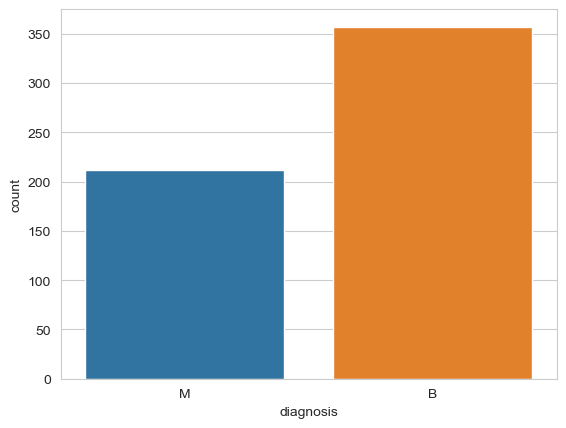

In [13]:
# Vizualization of Target variable
sns.countplot(x='diagnosis',data=df)
plt.show()

In [14]:
# Count of OutPut variable
df.diagnosis.value_counts()

B    357
M    212
Name: diagnosis, dtype: int64

## We have (357 - B = benign) and (212 - M = malignant) also Data is not balanced

In [15]:
Data1=df[["diagnosis", "radius_mean", "texture_mean", "perimeter_mean", "area_mean", "smoothness_mean", "compactness_mean", "concavity_mean", "concave points_mean"]]
Data2=df[["diagnosis", "concave points_mean", "symmetry_mean", "fractal_dimension_mean", "radius_se", "texture_se", "perimeter_se", "area_se", "smoothness_se", "compactness_se"]]
Data3=df[["diagnosis", "concavity_se", "concave points_se", "symmetry_se", "fractal_dimension_se", "radius_worst", "texture_worst", "perimeter_worst", "area_worst", "smoothness_worst", "compactness_worst", "concavity_worst", "concave points_worst", "symmetry_worst", "fractal_dimension_worst"]]

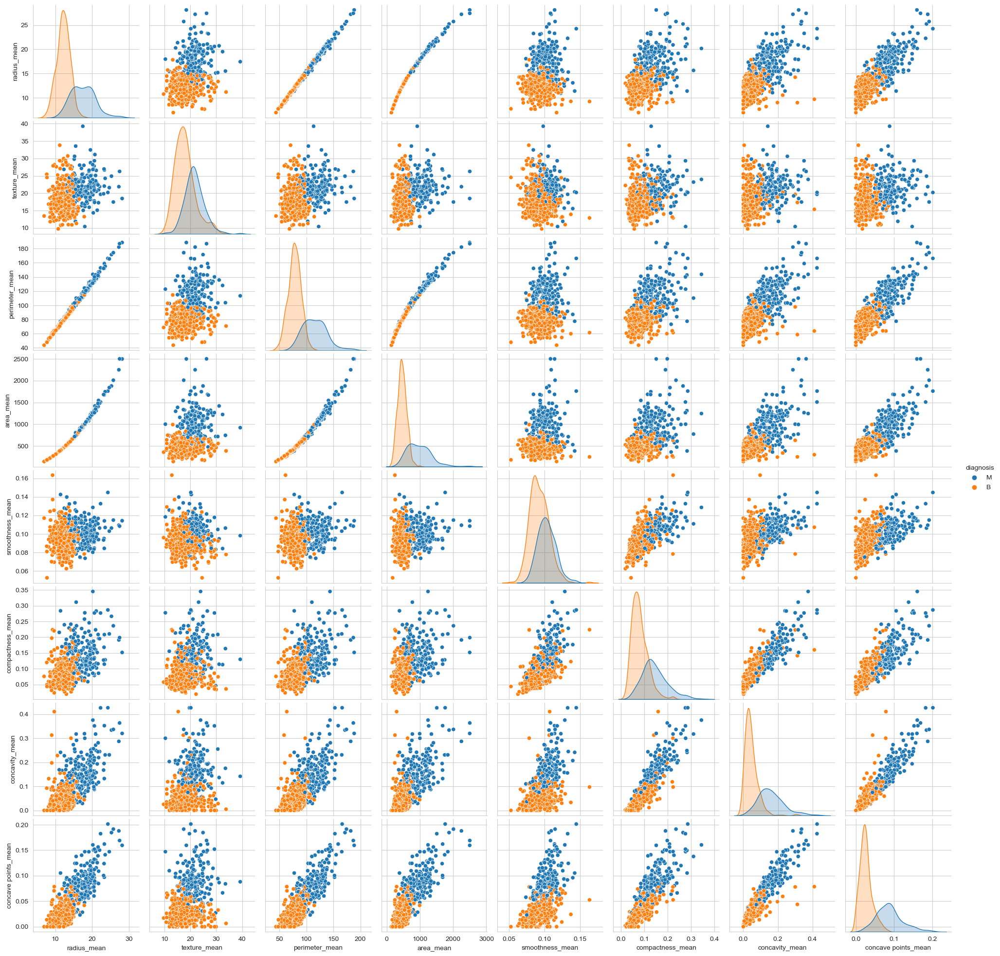

In [16]:
sns.pairplot(Data1,hue='diagnosis')
plt.show()

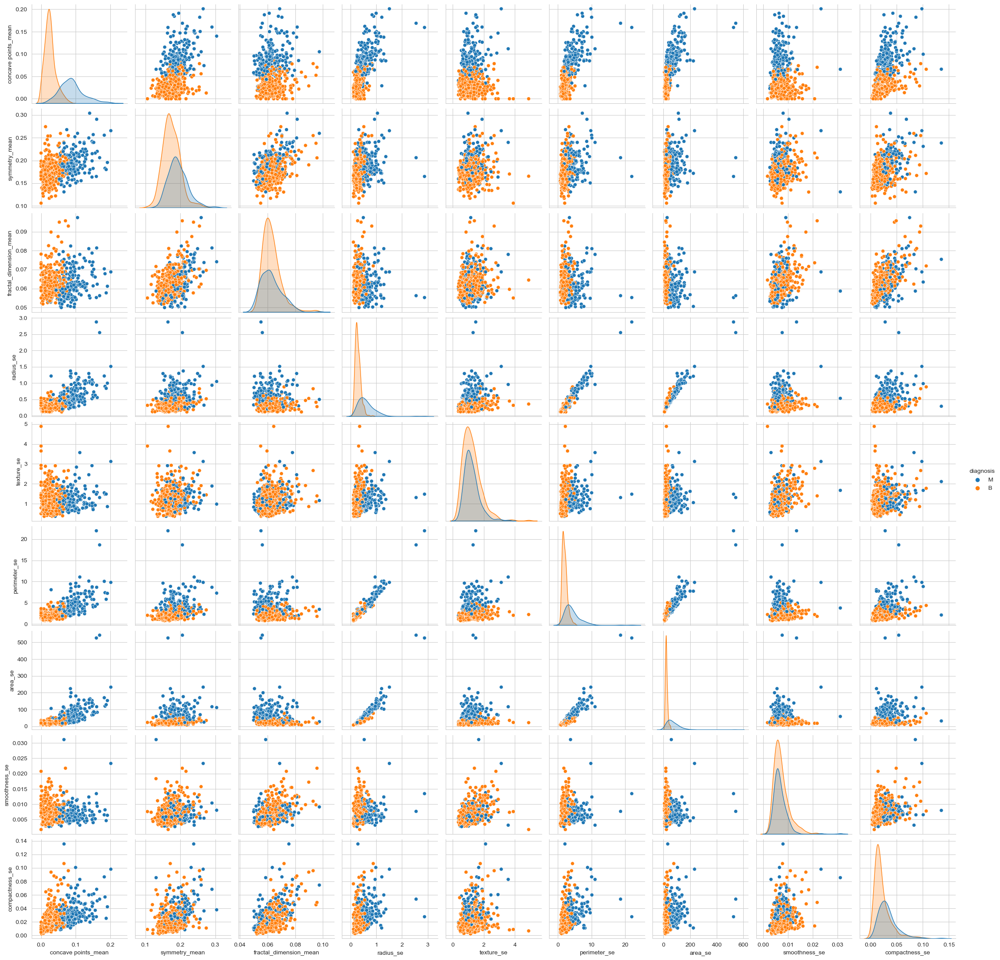

In [17]:
sns.pairplot(Data2,hue='diagnosis')
plt.show()

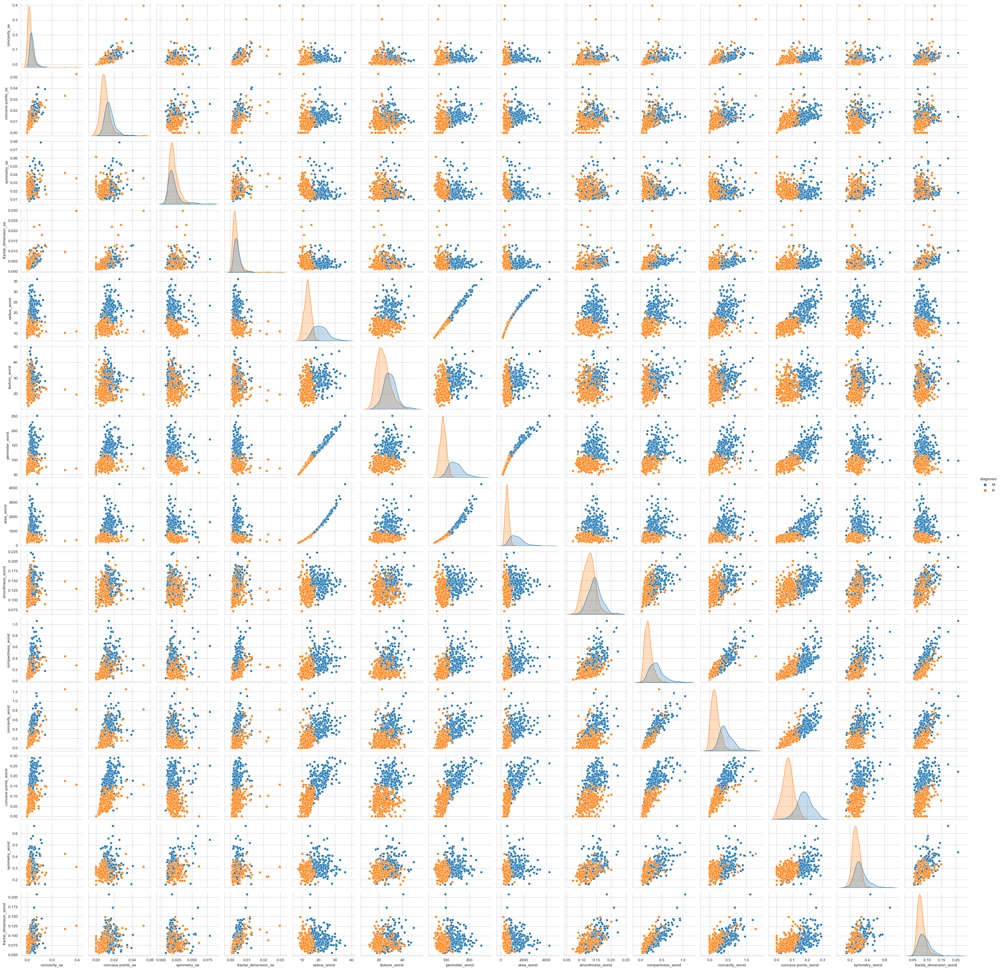

In [18]:
sns.pairplot(Data3,hue='diagnosis')
plt.show()

In [19]:
# Correlation inbeetween the feature variable 
corr=Data1.corr()

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\560912275.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr=Data1.corr()


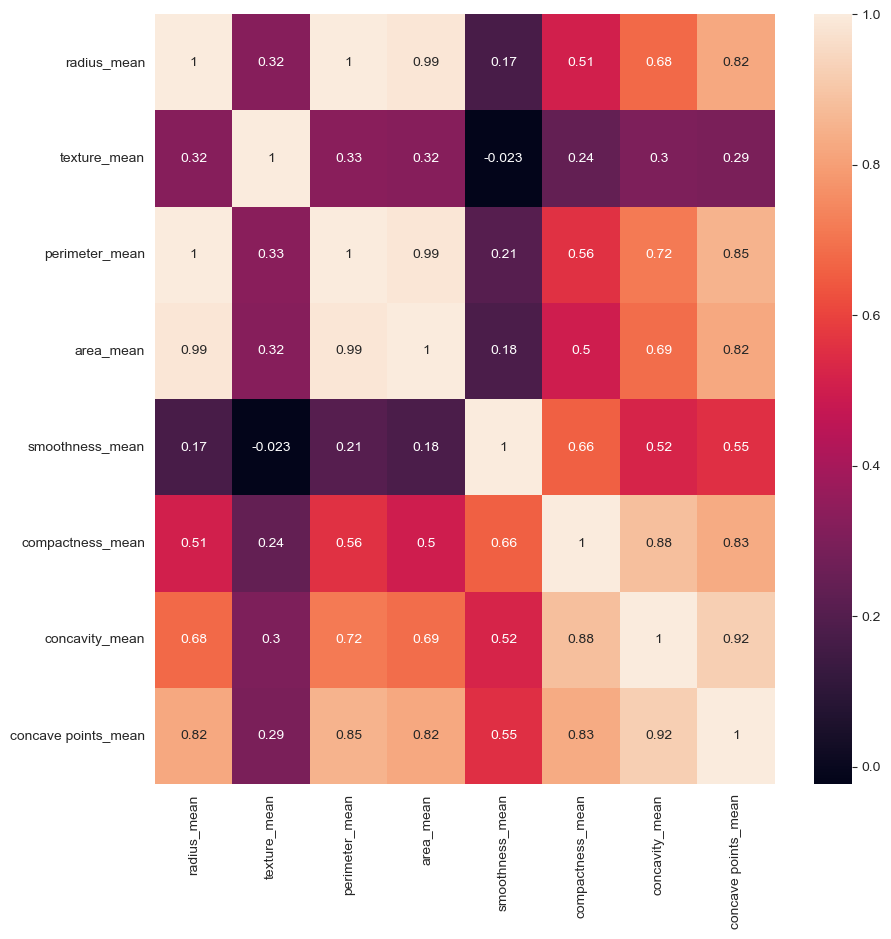

In [20]:
plt.figure(figsize=(10, 10))
sns.heatmap(corr,annot=True)
plt.show()

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\960373665.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr1=Data2.corr()


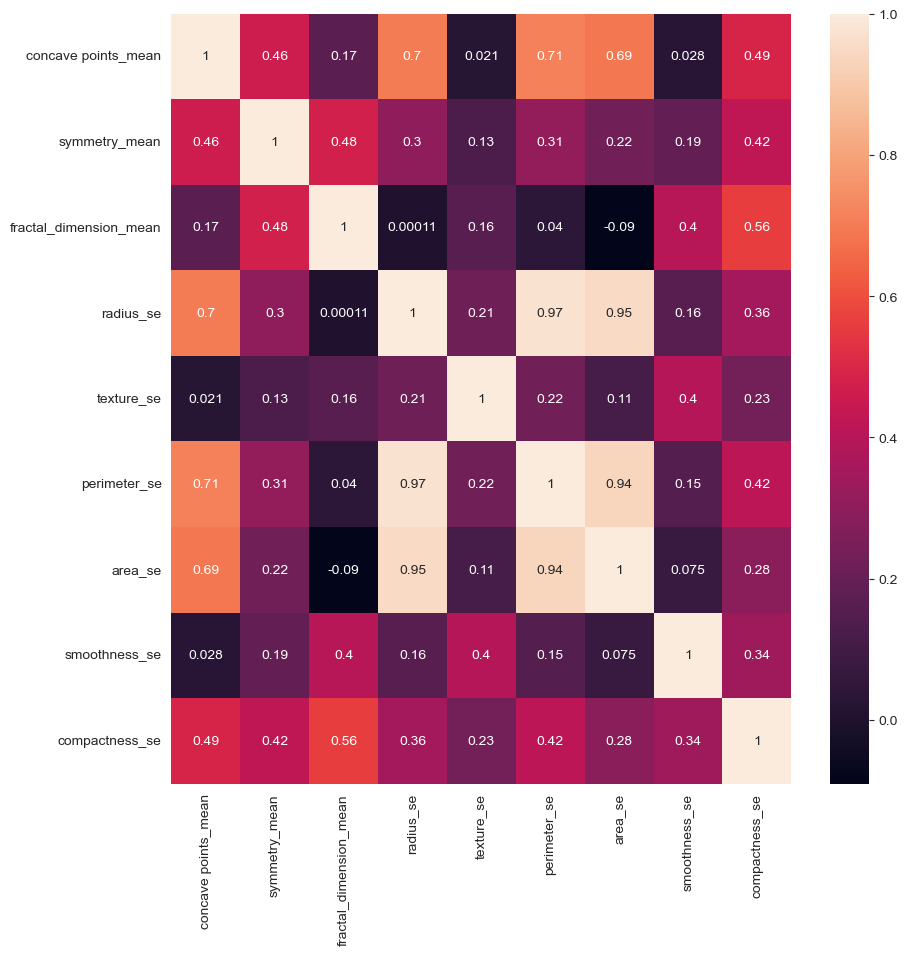

In [21]:
corr1=Data2.corr()
plt.figure(figsize=(10, 10))
sns.heatmap(corr1,annot=True)
plt.show()

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\424481615.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr2=Data3.corr()


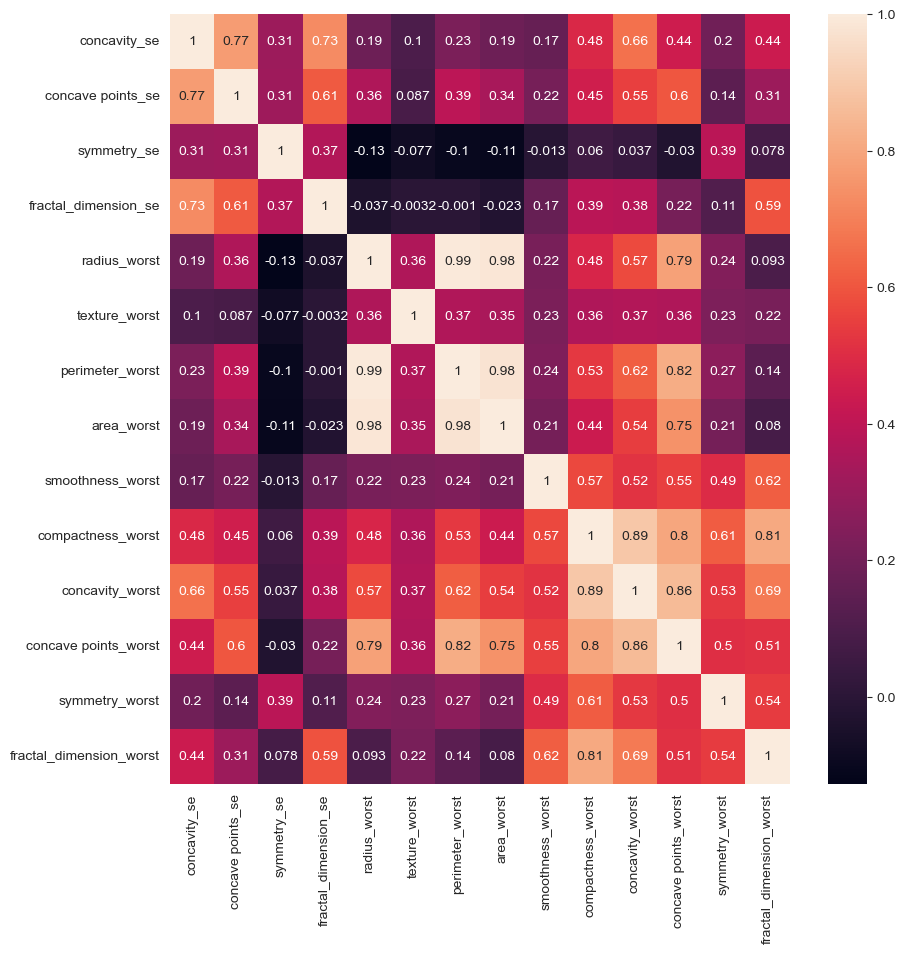

In [22]:
corr2=Data3.corr()
plt.figure(figsize=(10, 10))
sns.heatmap(corr2,annot=True)
plt.show()

In [24]:
#Selecting the numerical features
numeric_df=df.select_dtypes(include=np.number)

In [25]:
numeric_df.drop(['id','Unnamed: 32'],axis=1,inplace=True)

In [26]:
numeric_df.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


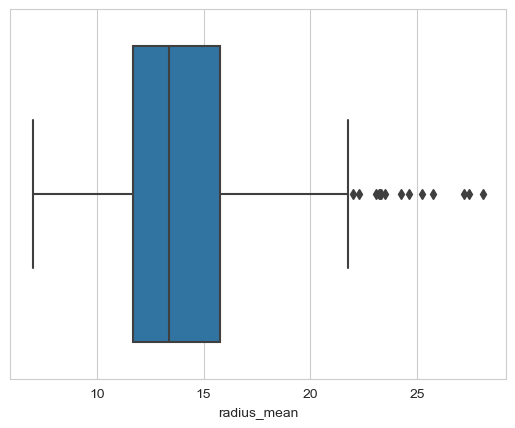

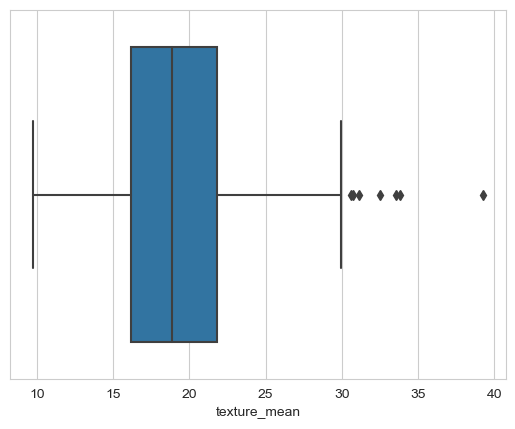

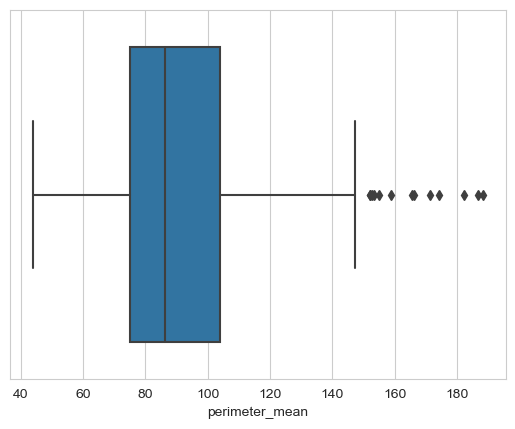

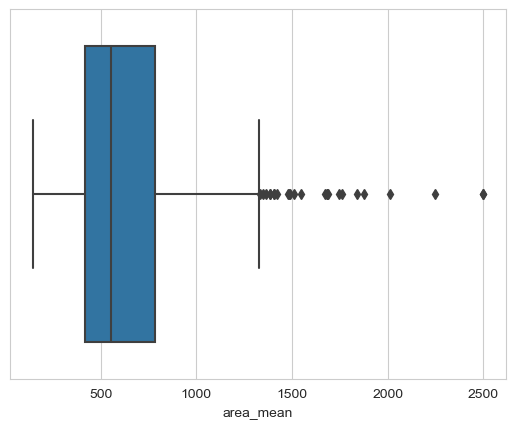

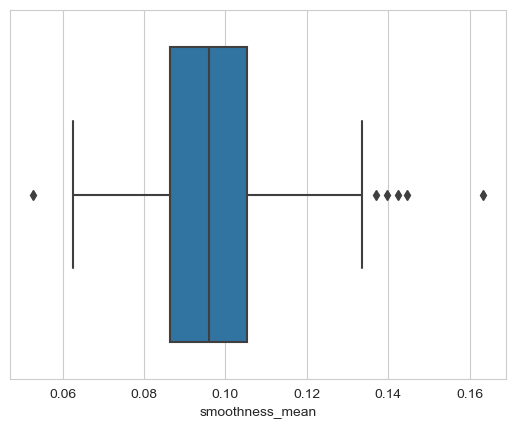

...

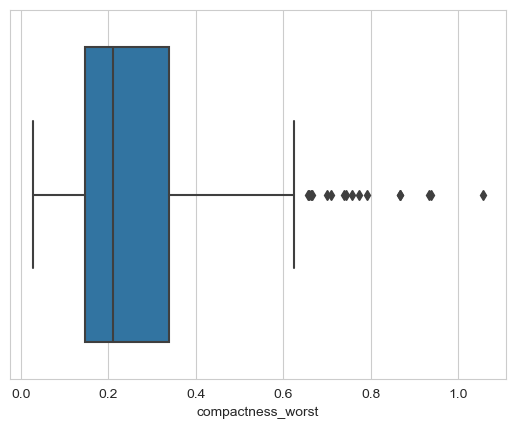

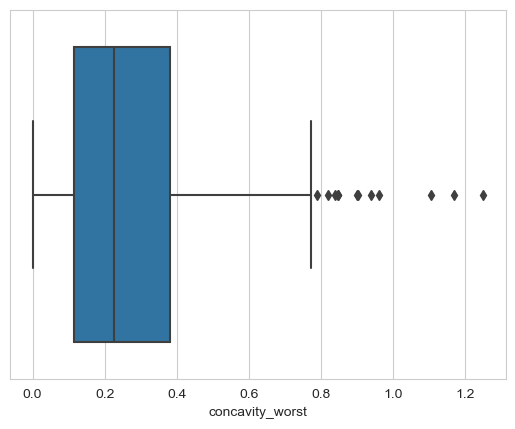

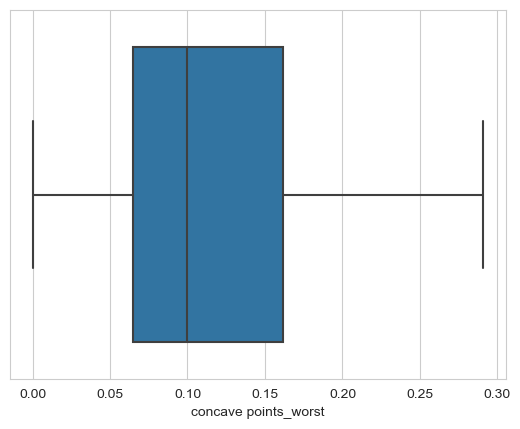

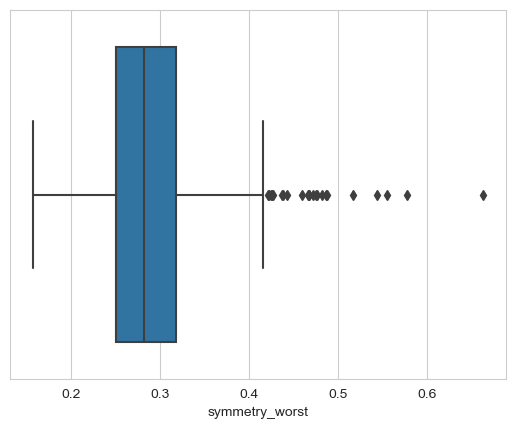

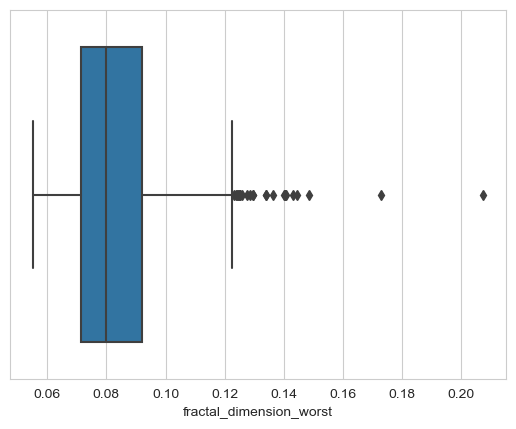

In [27]:
#Box Plot to find out the outliers in data

for col in numeric_df.columns:
    sns.boxplot(x=numeric_df[col])
    plt.show()

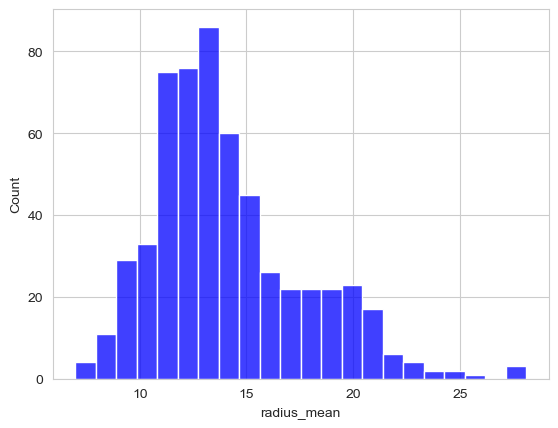

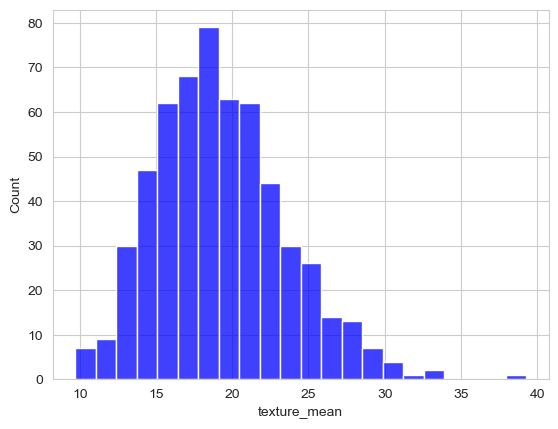

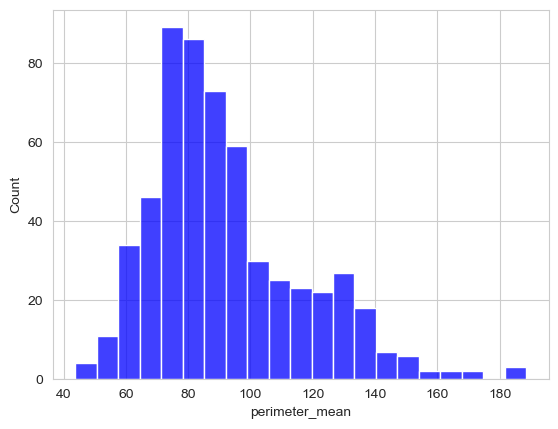

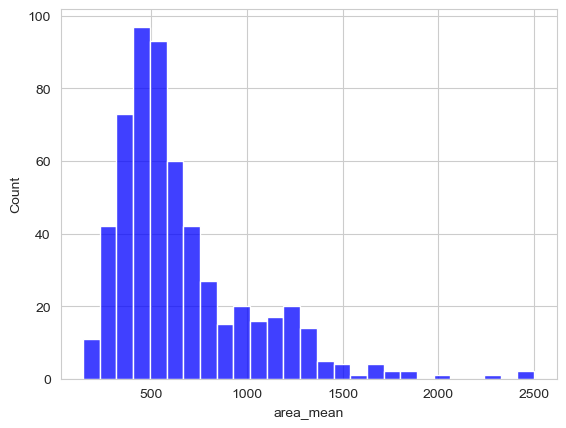

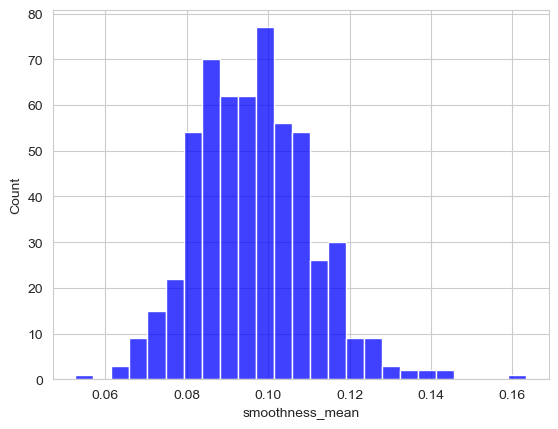

...

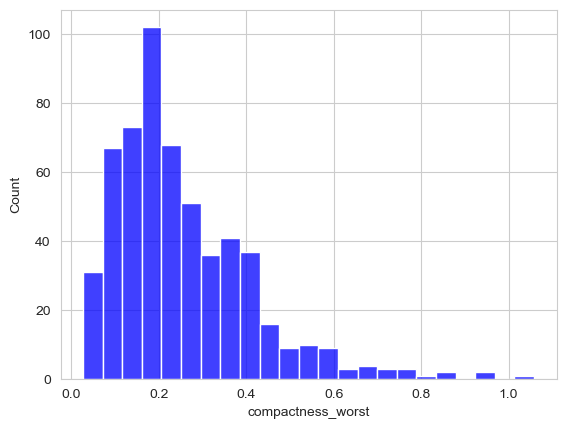

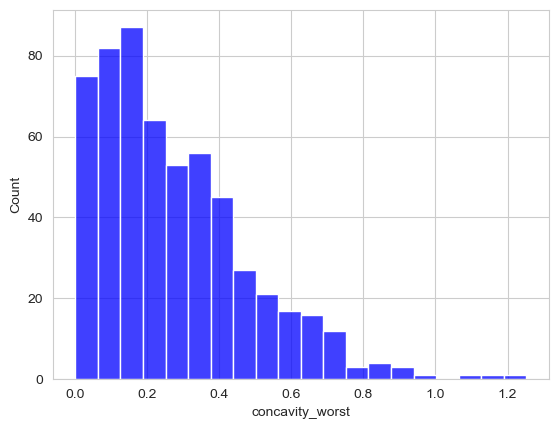

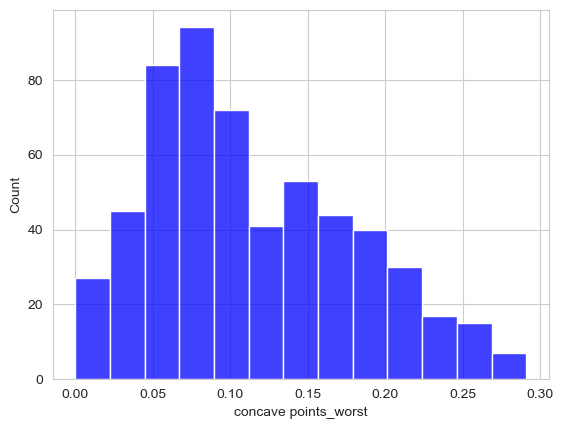

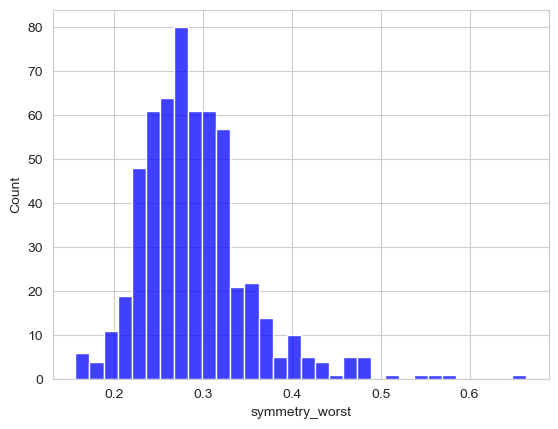

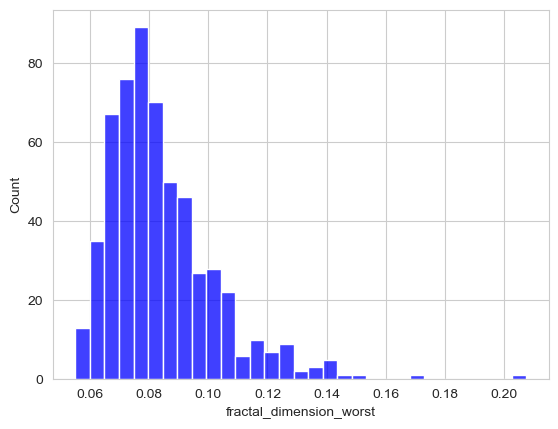

In [29]:
#Data histogram plot plot
for col in numeric_df.columns:
    sns.histplot(x=numeric_df[col],color='blue')
    plt.show()

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


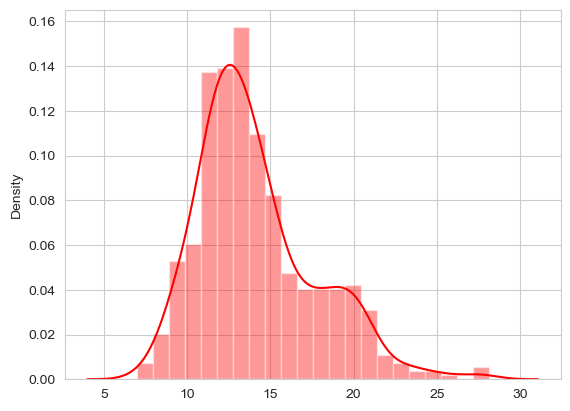

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


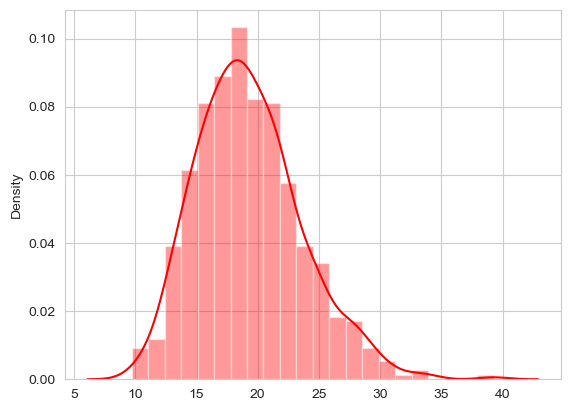

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


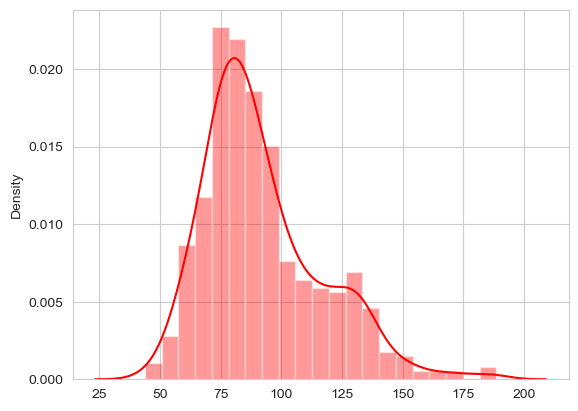

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


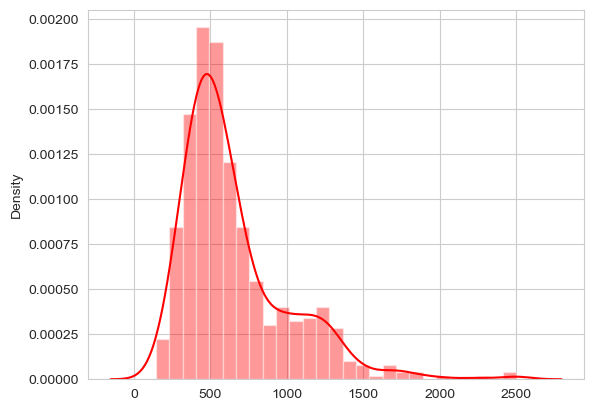

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


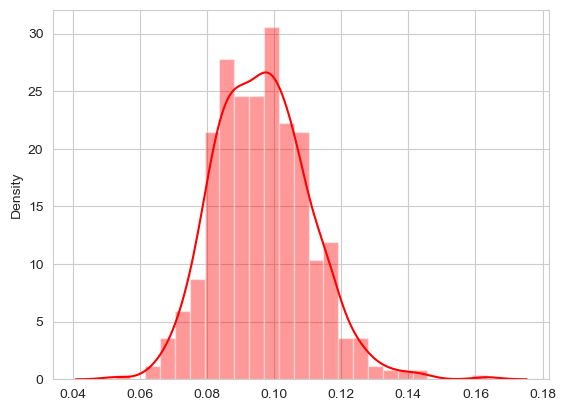

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


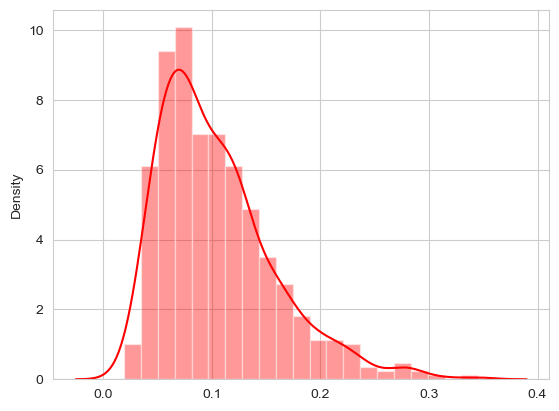

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


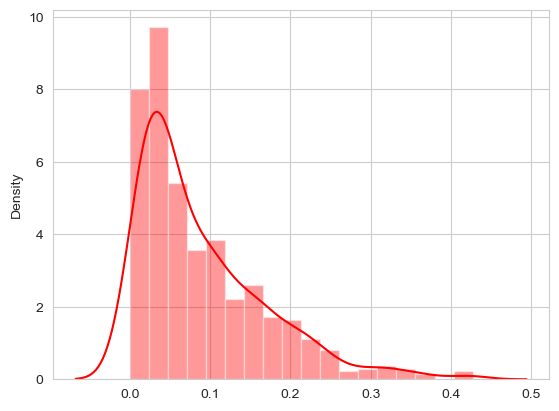

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


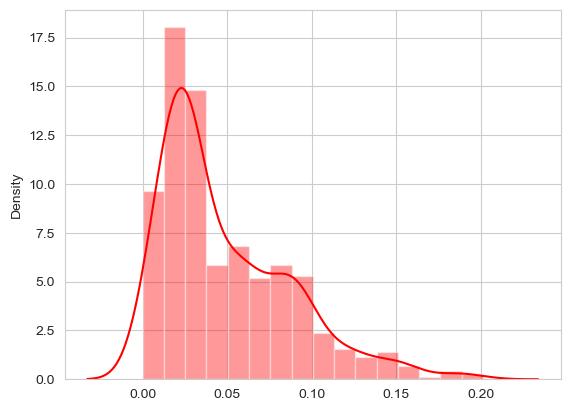

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


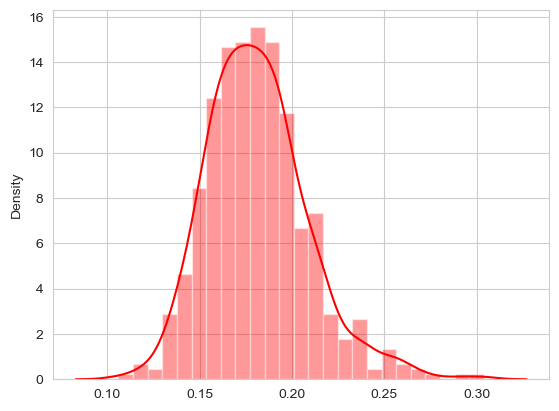

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


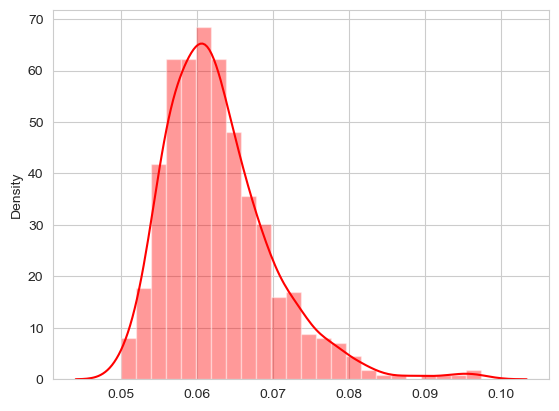

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


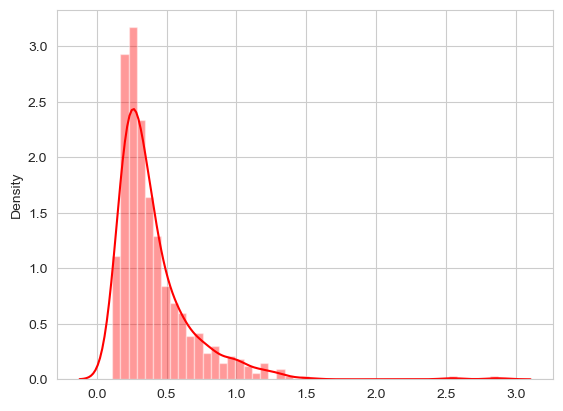

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


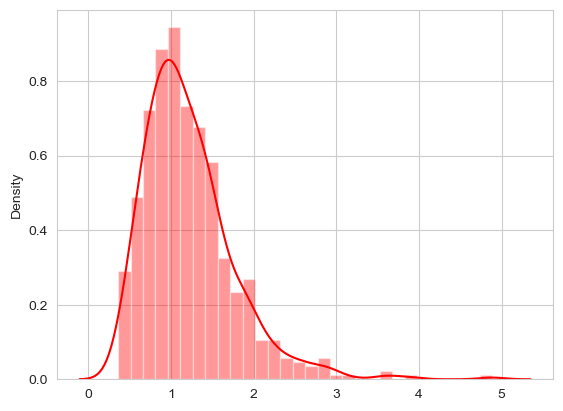

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


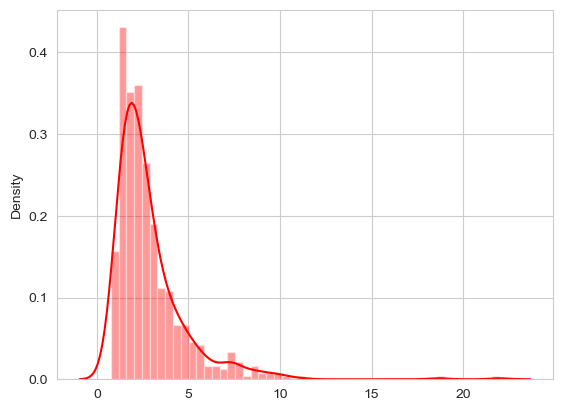

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


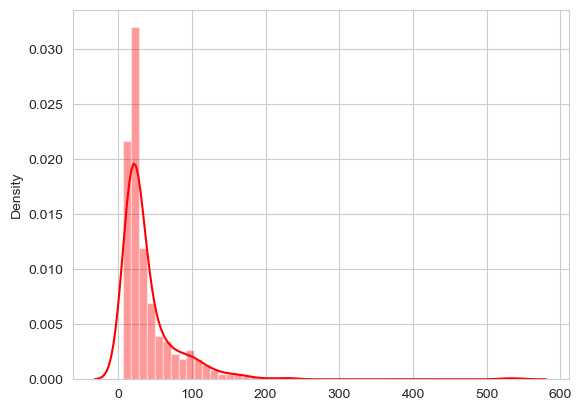

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


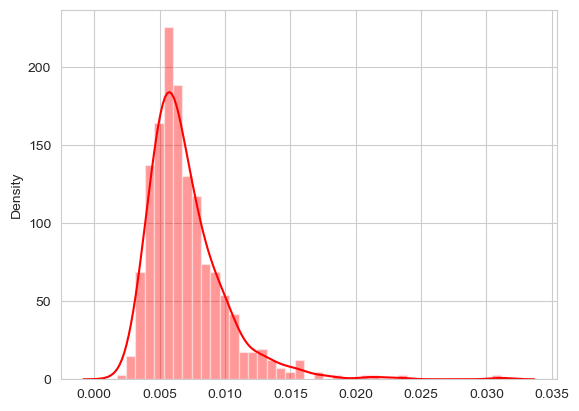

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


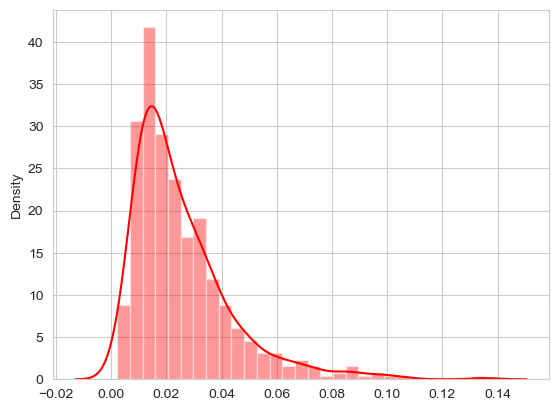

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


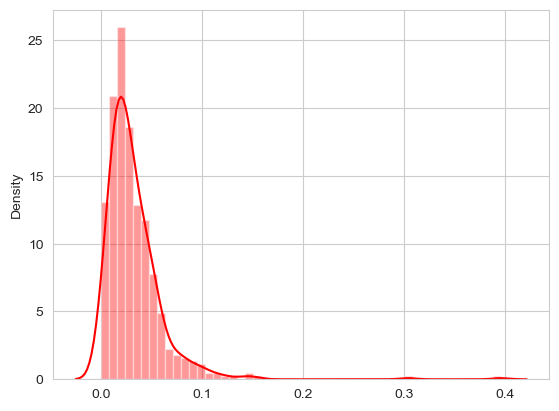

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


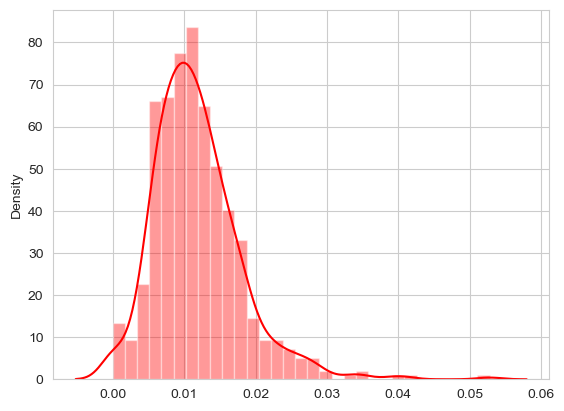

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


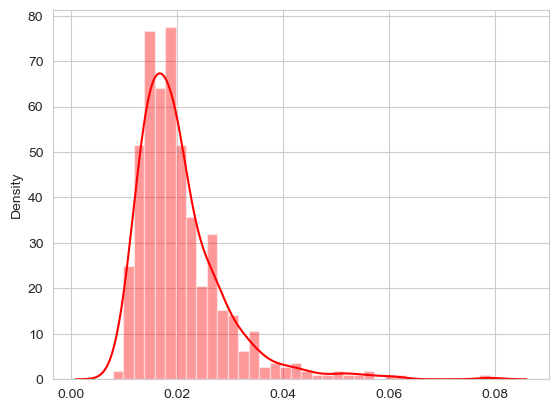

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


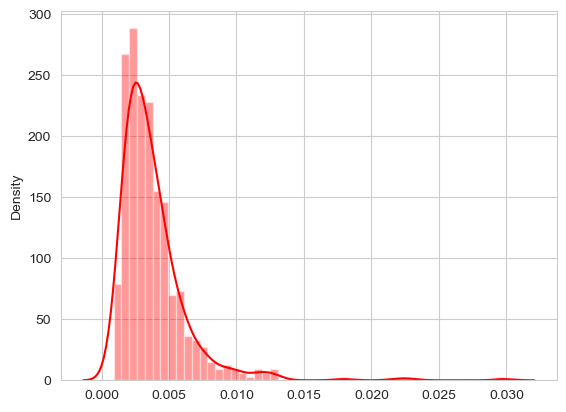

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


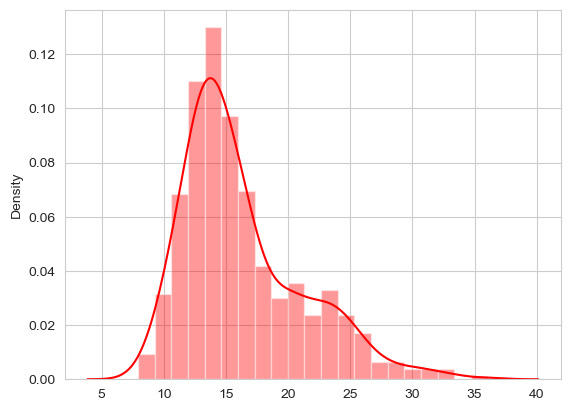

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


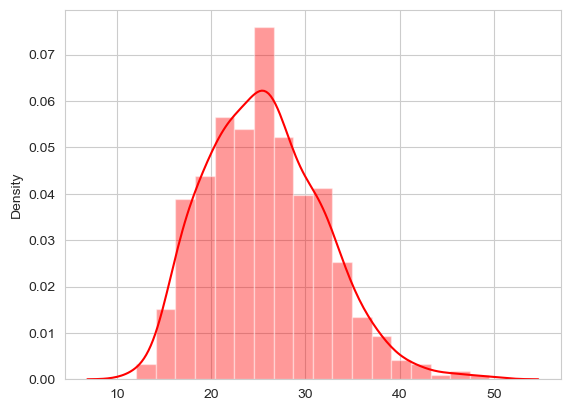

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


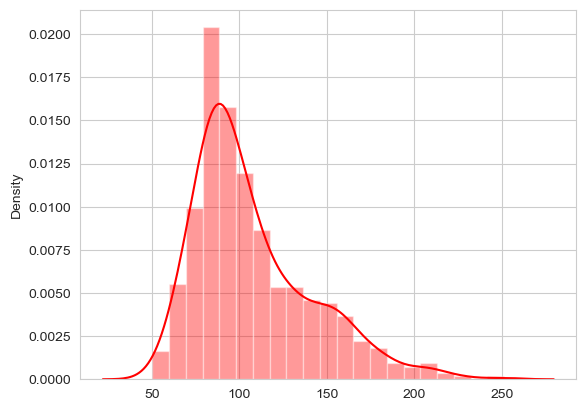

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


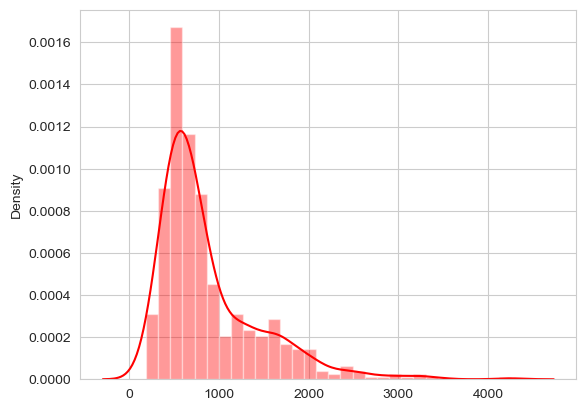

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


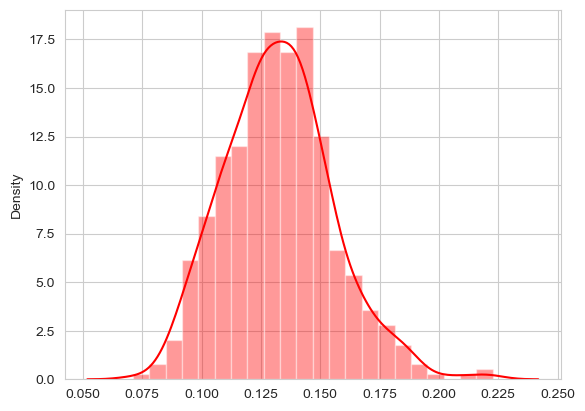

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


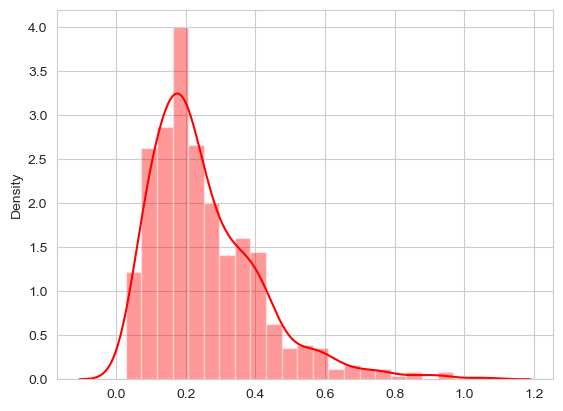

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


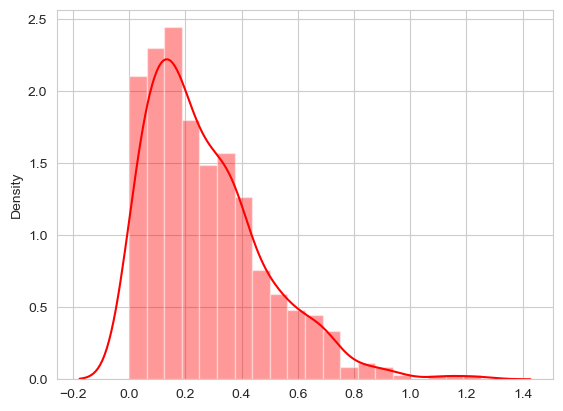

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


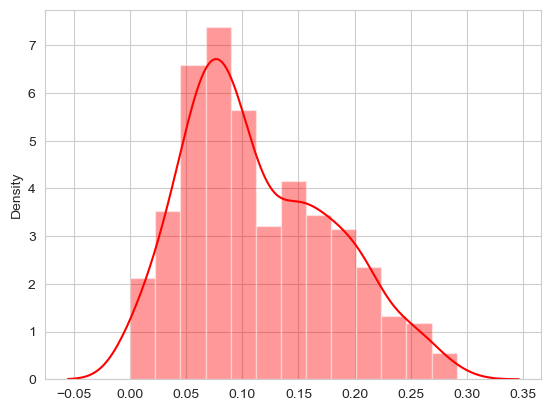

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


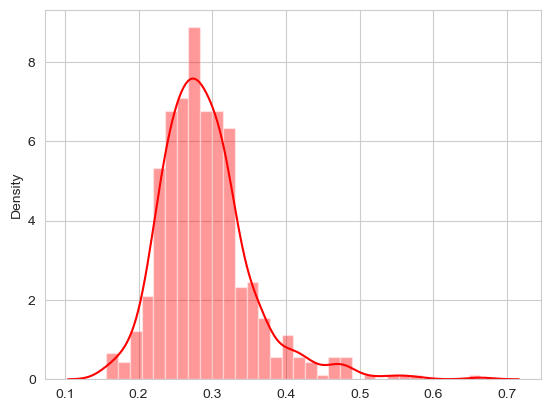

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4258906860.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=numeric_df[col],color='red')


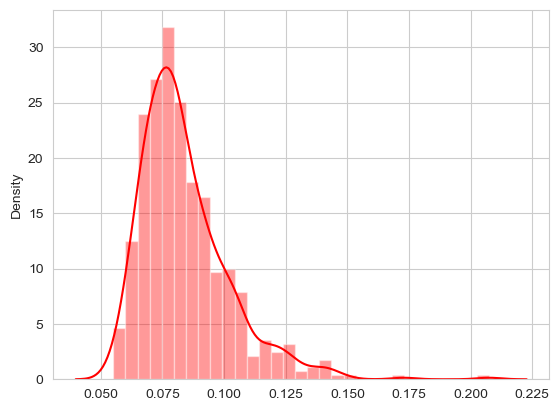

In [30]:
#Data distribusion plot
for col in numeric_df.columns:
    sns.distplot(x=numeric_df[col],color='red')
    plt.show()

In [31]:
df.isnull().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

##  Removing the insignificant columns

In [32]:
df.drop(['id','Unnamed: 32'],axis=1,inplace=True)

In [33]:
df.sample(10)

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
553,B,9.333,21.94,59.01,264.0,0.09240,0.05605,0.039960,0.012820,0.1692,...,9.845,25.05,62.86,295.8,0.11030,0.08298,0.07993,0.02564,0.2435,0.07393
362,B,12.760,18.84,81.87,496.6,0.09676,0.07952,0.026880,0.017810,0.1759,...,13.750,25.99,87.82,579.7,0.12980,0.18390,0.12550,0.08312,0.2744,0.07238
185,B,10.080,15.11,63.76,317.5,0.09267,0.04695,0.001597,0.002404,0.1703,...,11.870,21.18,75.39,437.0,0.15210,0.10190,0.00692,0.01042,0.2933,0.07697
493,B,12.460,12.83,78.83,477.3,0.07372,0.04043,0.007173,0.011490,0.1613,...,13.190,16.36,83.24,534.0,0.09439,0.06477,0.01674,0.02680,0.2280,0.07028
248,B,10.650,25.22,68.01,347.0,0.09657,0.07234,0.023790,0.016150,0.1897,...,12.250,35.19,77.98,455.7,0.14990,0.13980,0.11250,0.06136,0.3409,0.08147
124,B,13.370,16.39,86.10,553.5,0.07115,0.07325,0.080920,0.028000,0.1422,...,14.260,22.75,91.99,632.1,0.10250,0.25310,0.33080,0.08978,0.2048,0.07628
301,B,12.460,19.89,80.43,471.3,0.08451,0.10140,0.068300,0.030990,0.1781,...,13.460,23.07,88.13,551.3,0.10500,0.21580,0.19040,0.07625,0.2685,0.07764
489,M,16.690,20.20,107.10,857.6,0.07497,0.07112,0.036490,0.023070,0.1846,...,19.180,26.56,127.30,1084.0,0.10090,0.29200,0.24770,0.08737,0.4677,0.07623
343,M,19.680,21.68,129.90,1194.0,0.09797,0.13390,0.186300,0.110300,0.2082,...,22.750,34.66,157.60,1540.0,0.12180,0.34580,0.47340,0.22550,0.4045,0.07918
334,B,12.300,19.02,77.88,464.4,0.08313,0.04202,0.007756,0.008535,0.1539,...,13.350,28.46,84.53,544.3,0.12220,0.09052,0.03619,0.03983,0.2554,0.07207


## Removing duplicate data

In [35]:
#Duplicate Records
df.duplicated().sum()            ## No Duplicat data found

0

## Encoding the categorical variables

In [38]:
from sklearn import preprocessing 

In [39]:
label_encoder = preprocessing.LabelEncoder() 

In [40]:
df['diagnosis']= label_encoder.fit_transform(df['diagnosis']) 

df['diagnosis'].unique() 

array([1, 0])

In [41]:
df['diagnosis'].value_counts()

0    357
1    212
Name: diagnosis, dtype: int64

In [42]:
df.head(10)

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678
5,1,12.45,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,0.2087,...,15.47,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.12440
6,1,18.25,19.98,119.60,1040.0,0.09463,0.10900,0.11270,0.07400,0.1794,...,22.88,27.66,153.20,1606.0,0.1442,0.2576,0.3784,0.1932,0.3063,0.08368
7,1,13.71,20.83,90.20,577.9,0.11890,0.16450,0.09366,0.05985,0.2196,...,17.06,28.14,110.60,897.0,0.1654,0.3682,0.2678,0.1556,0.3196,0.11510
8,1,13.00,21.82,87.50,519.8,0.12730,0.19320,0.18590,0.09353,0.2350,...,15.49,30.73,106.20,739.3,0.1703,0.5401,0.5390,0.2060,0.4378,0.10720
9,1,12.46,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,0.2030,...,15.09,40.68,97.65,711.4,0.1853,1.0580,1.1050,0.2210,0.4366,0.20750


In [43]:
df.dtypes

diagnosis                    int32
radius_mean                float64
texture_mean               float64
perimeter_mean             float64
area_mean                  float64
smoothness_mean            float64
compactness_mean           float64
concavity_mean             float64
concave points_mean        float64
symmetry_mean              float64
fractal_dimension_mean     float64
radius_se                  float64
texture_se                 float64
perimeter_se               float64
area_se                    float64
smoothness_se              float64
compactness_se             float64
concavity_se               float64
concave points_se          float64
symmetry_se                float64
fractal_dimension_se       float64
radius_worst               float64
texture_worst              float64
perimeter_worst            float64
area_worst                 float64
smoothness_worst           float64
compactness_worst          float64
concavity_worst            float64
concave points_worst

## Handling the outliers

In [44]:
def removeOutlier(col):
    sorted(col)
    quant1,quant2=col.quantile([0.25,0.75])
    IQR=quant2-quant1
    lowerRange=quant1-(1.5*IQR)
    upperRange=quant2+(1.5*IQR)
    return lowerRange,upperRange


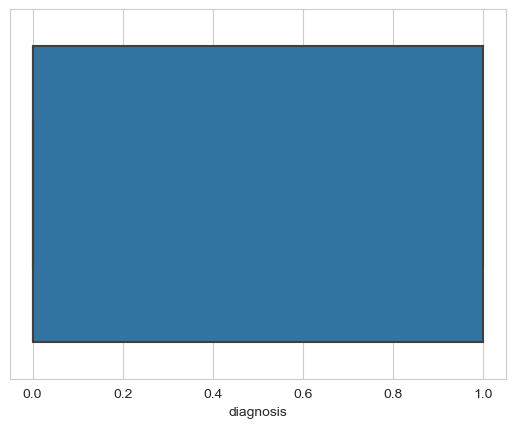

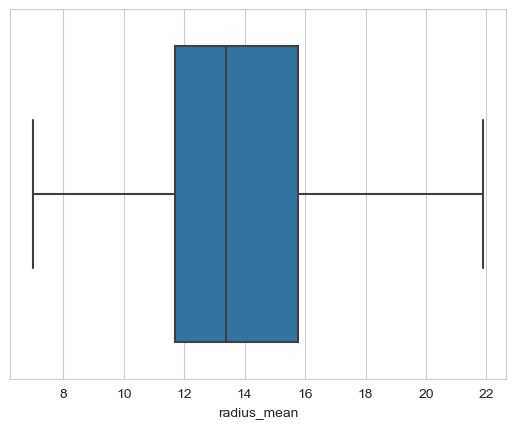

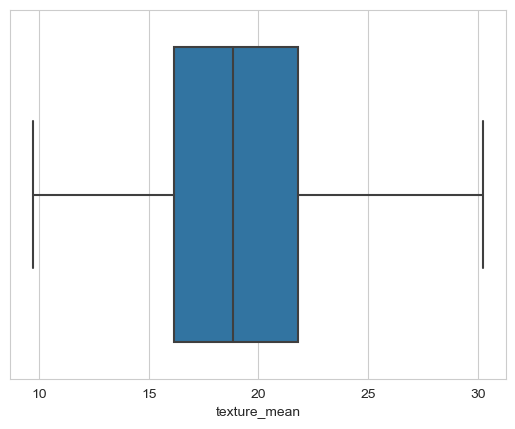

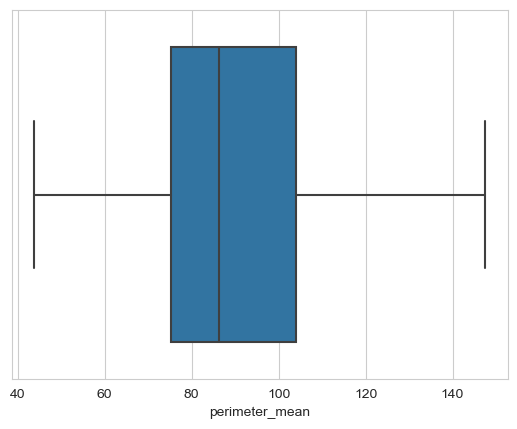

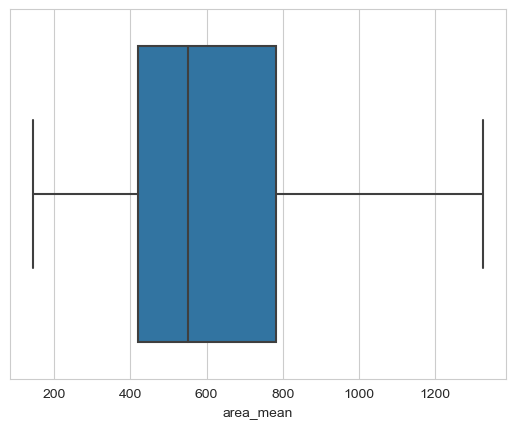

...

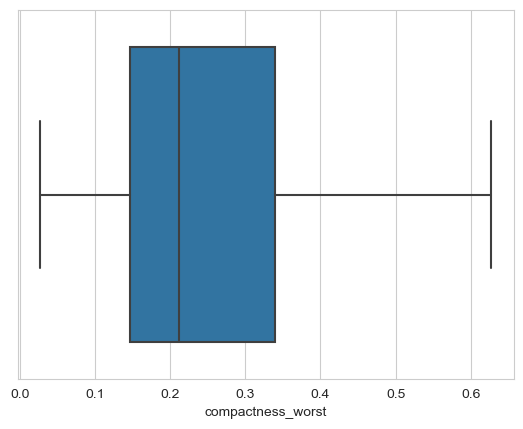

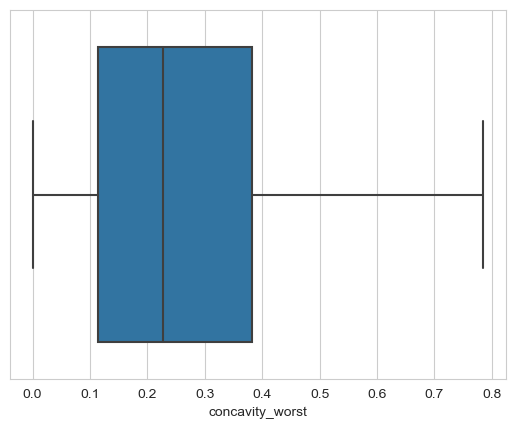

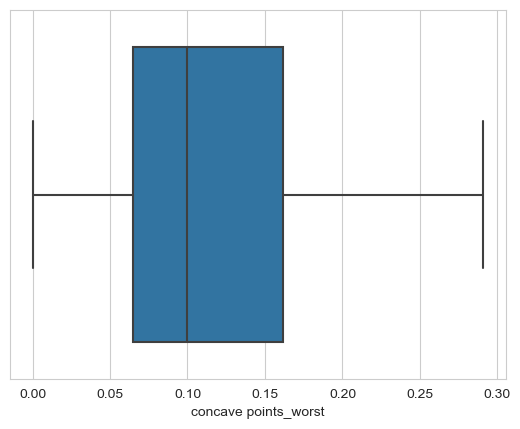

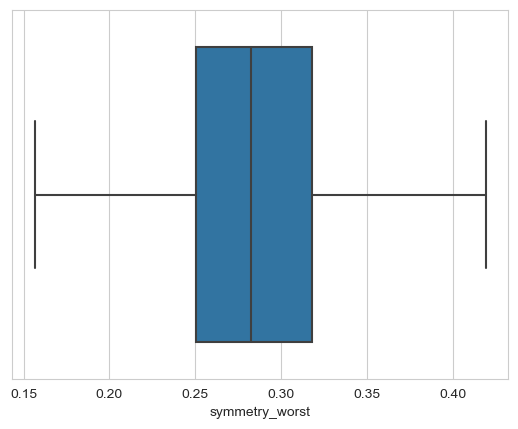

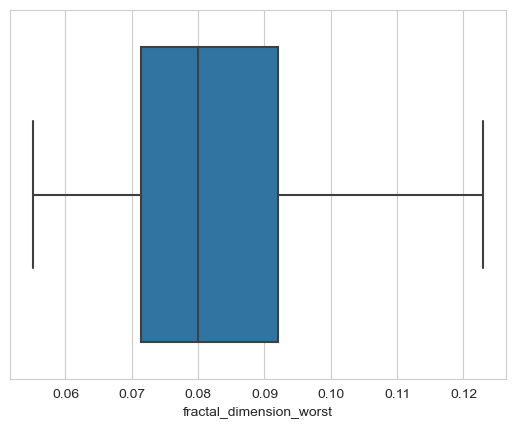

In [45]:
for col in df.columns:
    lowScore,highScore=removeOutlier(df[col])
    df[col]=np.where(df[col]>highScore,highScore,df[col])
    df[col]=np.where(df[col]<lowScore,lowScore,df[col])

    sns.boxplot(x=df[col],data=df)
    plt.show()

##  Skewness checking and removing the skewness from the data

In [46]:
from scipy.stats import skew

With Skewness diagnosis
0.5270671676029054


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


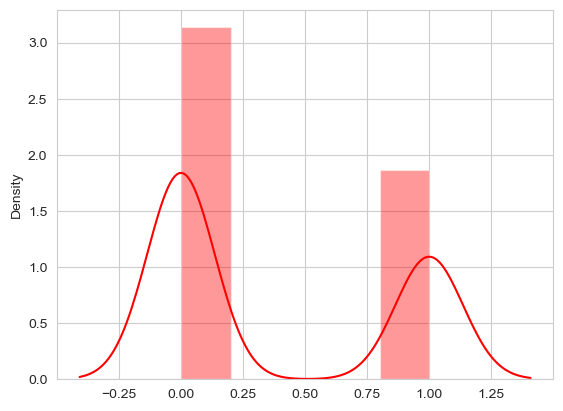

Without Skewness diagnosis
0.5270671676029054


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


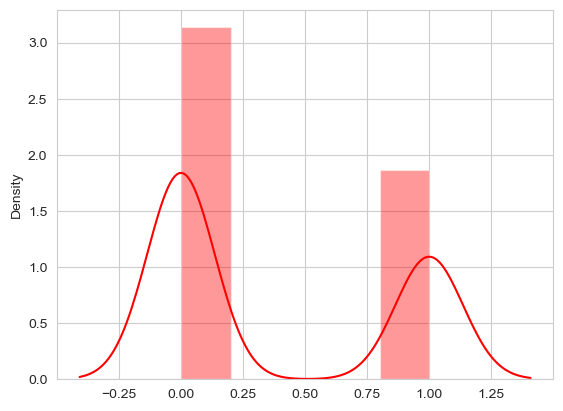

With Skewness radius_mean
0.42202979031102617


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


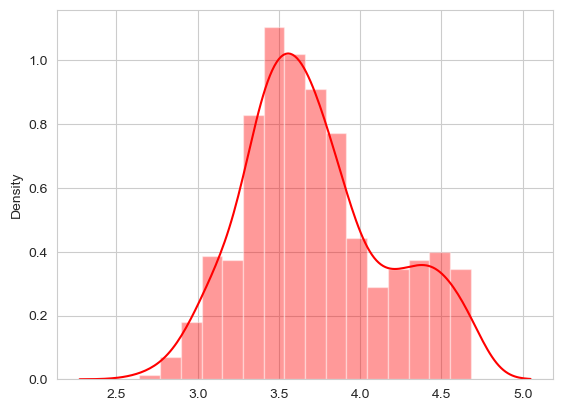

Without Skewness radius_mean
0.2975820163037894


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


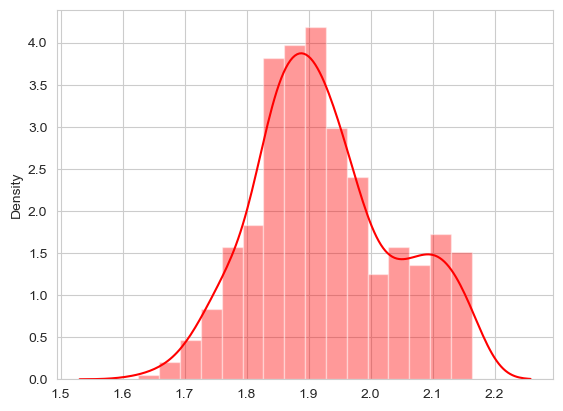

With Skewness texture_mean
0.18046283473756766


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


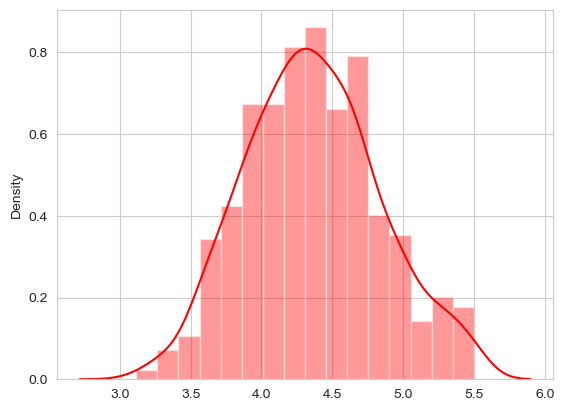

Without Skewness texture_mean
0.043426728885487154


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


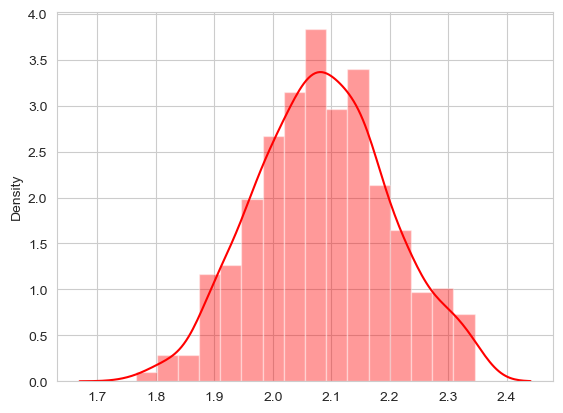

With Skewness perimeter_mean
0.4557710689859759


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


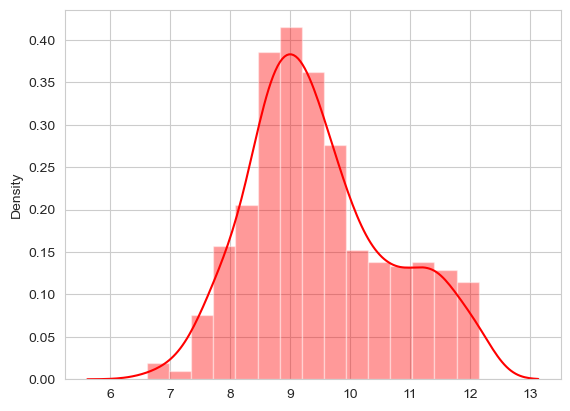

Without Skewness perimeter_mean
0.32539972318402016


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


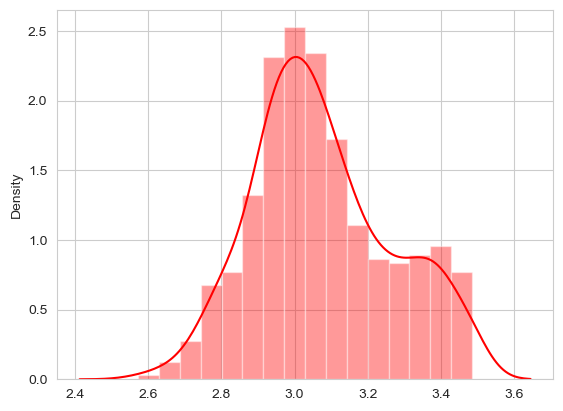

With Skewness area_mean
0.5519512488646364


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


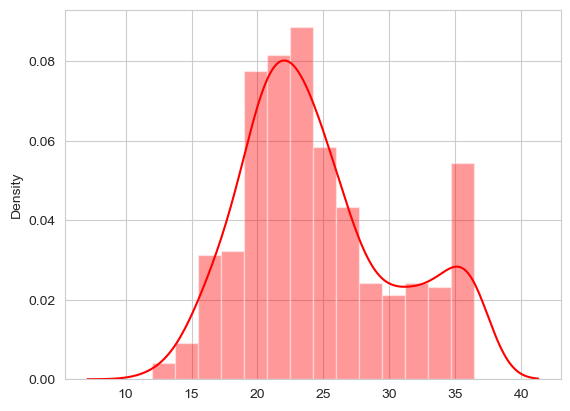

Without Skewness area_mean
0.33304826716273916


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


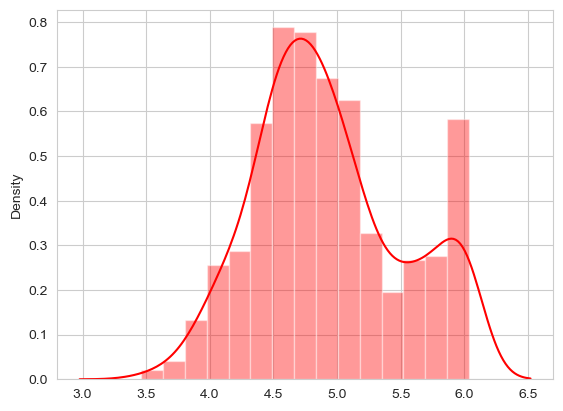

With Skewness smoothness_mean
0.0654402706892369


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


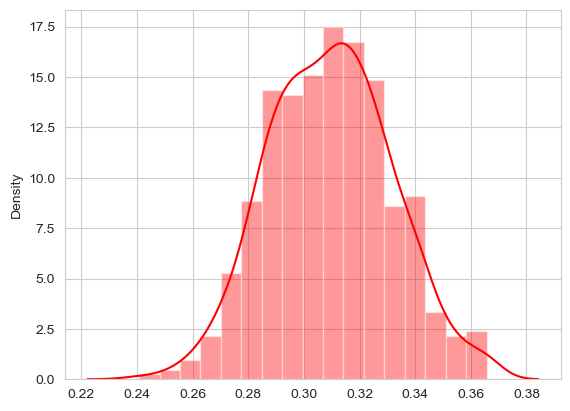

Without Skewness smoothness_mean
-0.03199624369947074


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


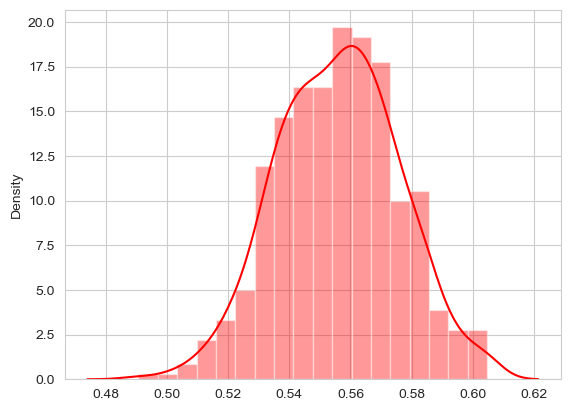

With Skewness compactness_mean
0.37145314741320784


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


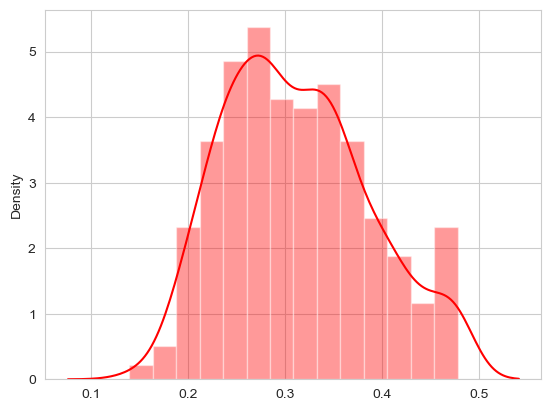

Without Skewness compactness_mean
0.12882808718903113


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


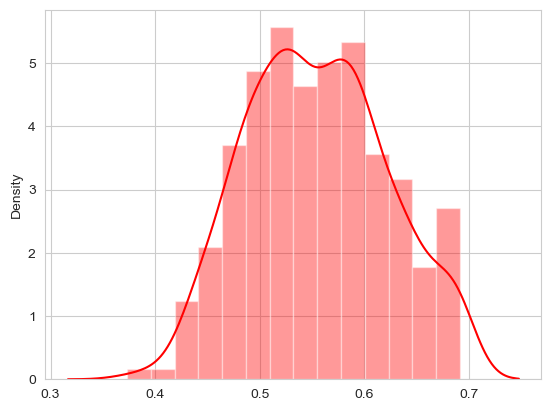

With Skewness concavity_mean
0.21357010081377487


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


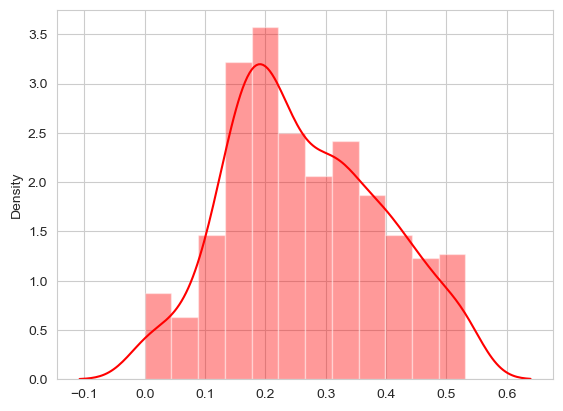

Without Skewness concavity_mean
-0.8908362353643009


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


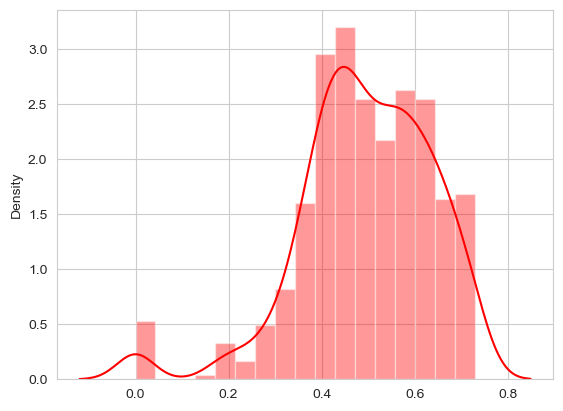

With Skewness concave points_mean
0.17746815873392768


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


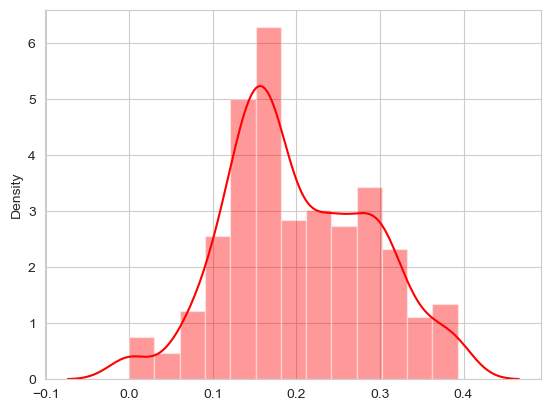

Without Skewness concave points_mean
-1.1671257367910175


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


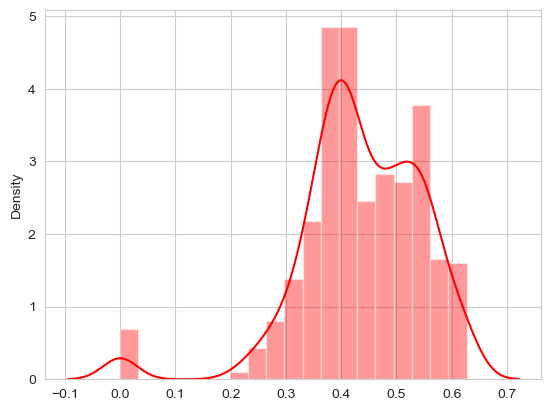

With Skewness symmetry_mean
0.2009530143951156


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


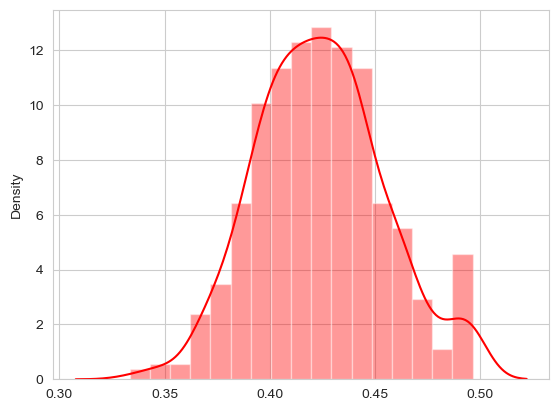

Without Skewness symmetry_mean
0.09788595000961382


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


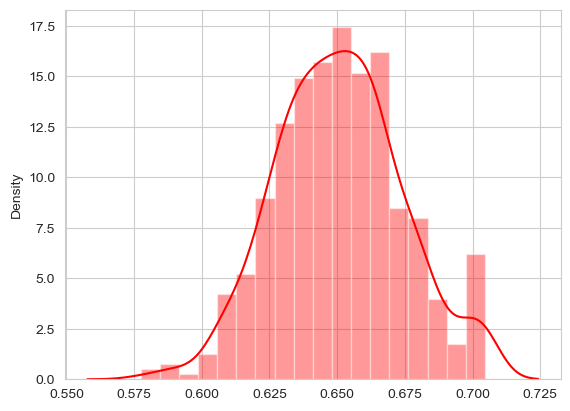

With Skewness fractal_dimension_mean
0.5647879298579321


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


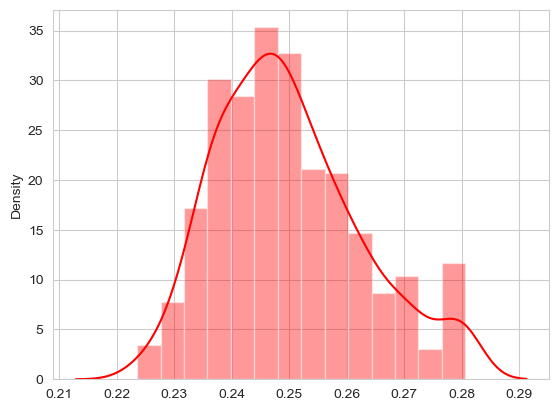

Without Skewness fractal_dimension_mean
0.5068326885226649


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


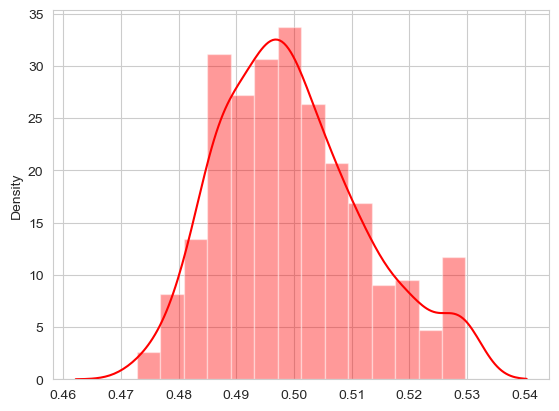

With Skewness radius_se
0.6546656777436243


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


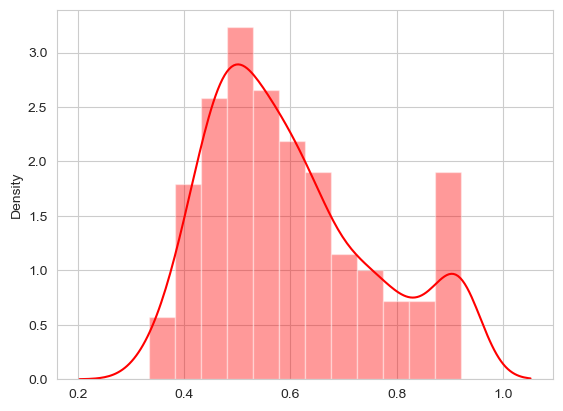

Without Skewness radius_se
0.44940663222970156


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


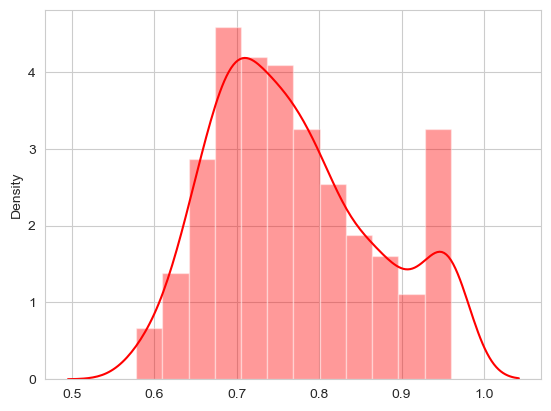

With Skewness texture_se
0.29642044979145066


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


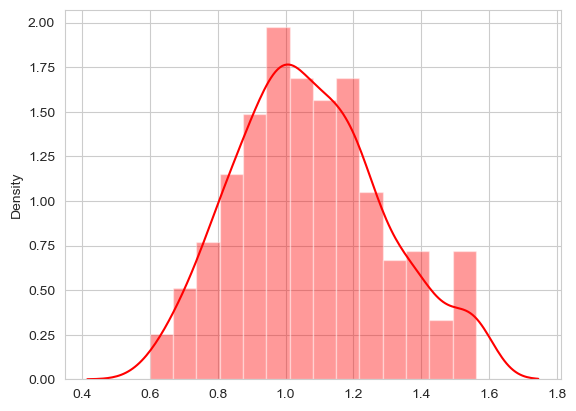

Without Skewness texture_se
0.062285975070542086


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


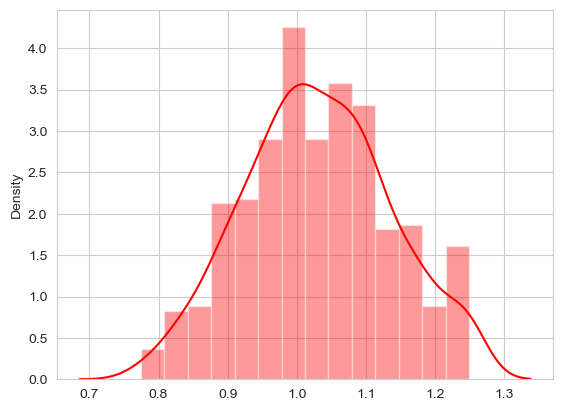

With Skewness perimeter_se
0.6500416534986009


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


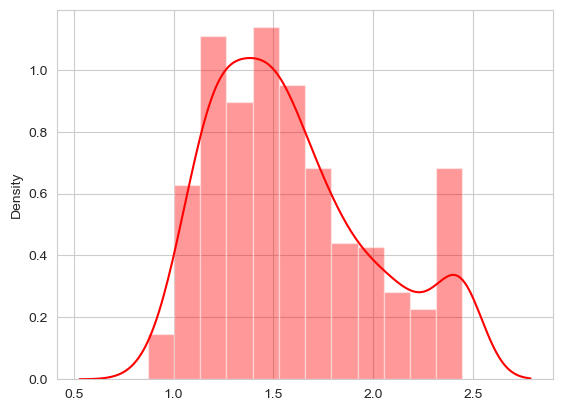

Without Skewness perimeter_se
0.4421931088648869


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


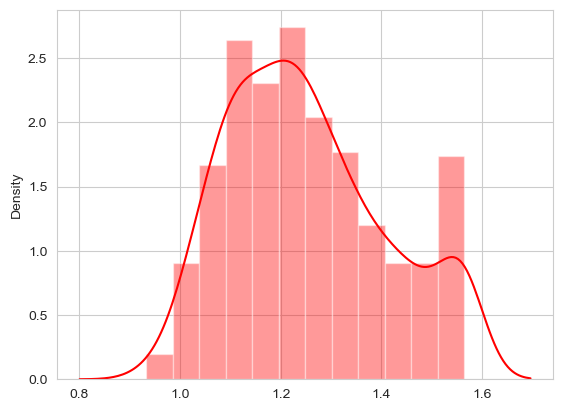

With Skewness area_se
0.7961699353610243


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


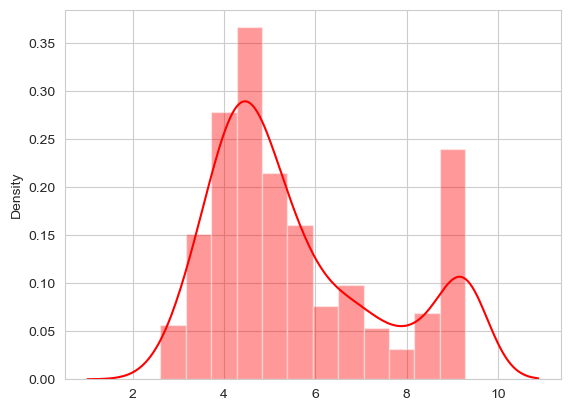

Without Skewness area_se
0.5893047152237494


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


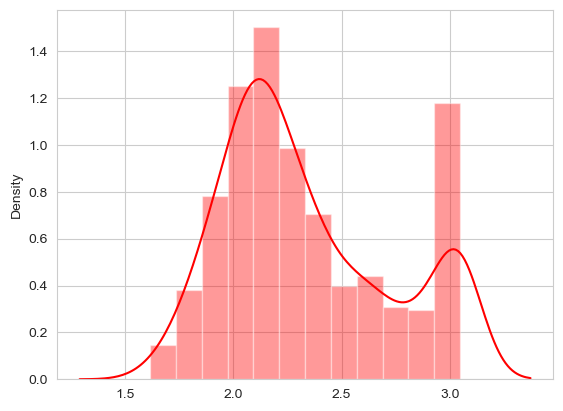

With Skewness smoothness_se
0.4147433913986774


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


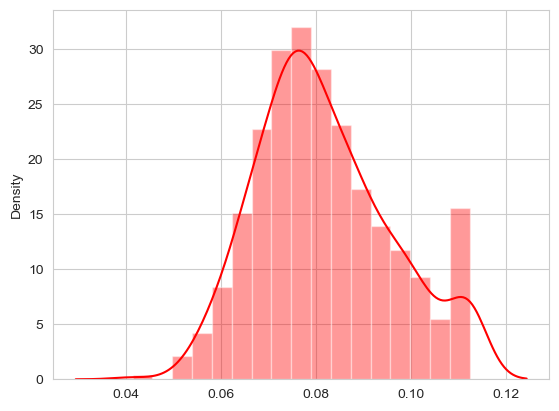

Without Skewness smoothness_se
0.21294604248453727


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


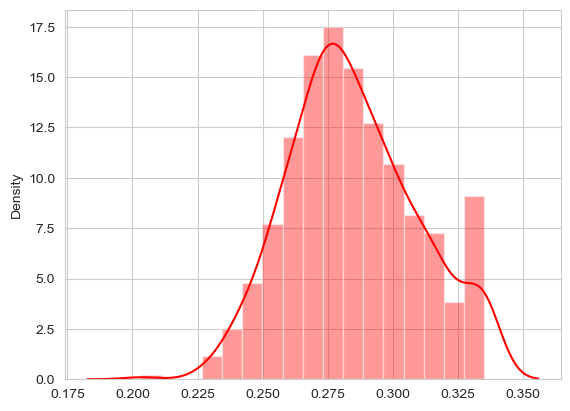

With Skewness compactness_se
0.4626145991247444


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


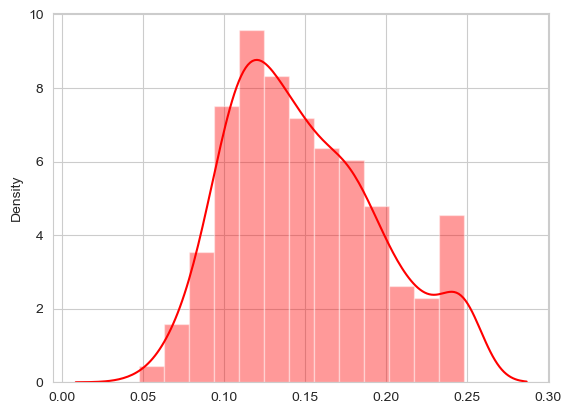

Without Skewness compactness_se
0.15685525716903984


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


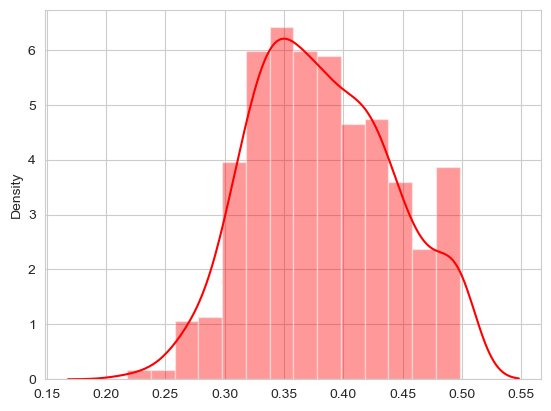

With Skewness concavity_se
-0.09502783537973851


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


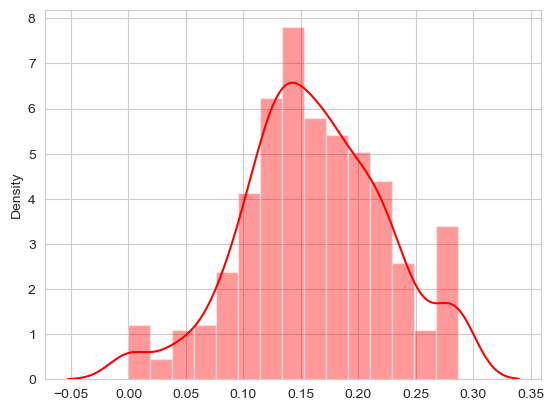

Without Skewness concavity_se
-1.6010867020895618


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


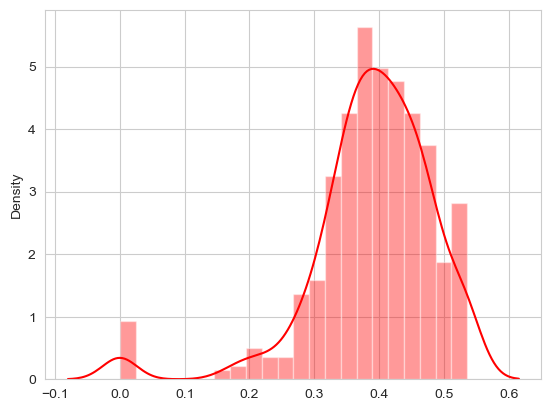

With Skewness concave points_se
-0.8201346140504422


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


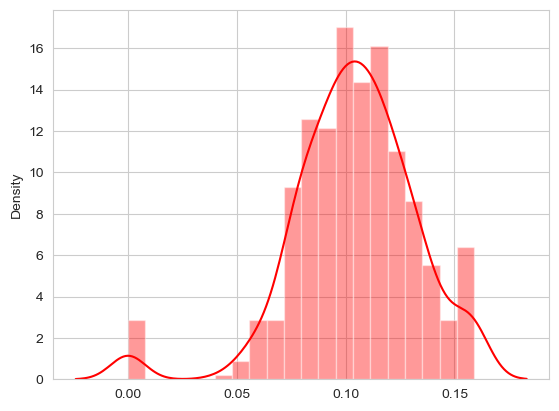

Without Skewness concave points_se
-3.1307215291540396


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


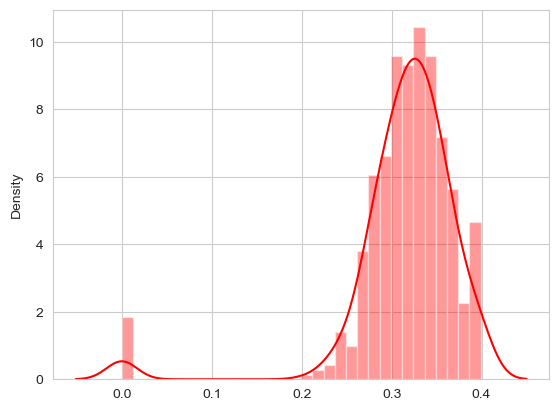

With Skewness symmetry_se
0.5640792216990653


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


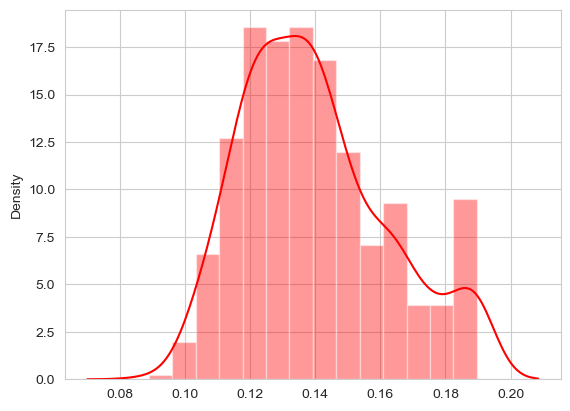

Without Skewness symmetry_se
0.4057256731069293


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


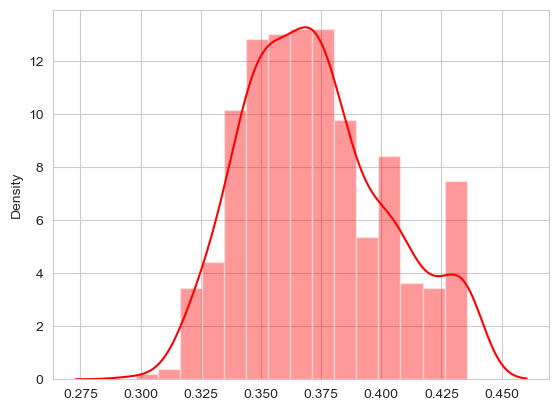

With Skewness fractal_dimension_se
0.5347217152375553


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


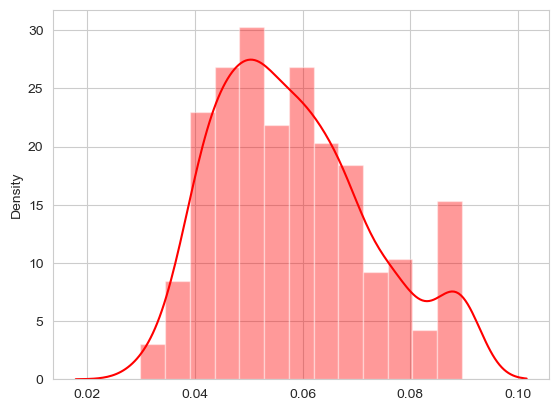

Without Skewness fractal_dimension_se
0.29927523655505367


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


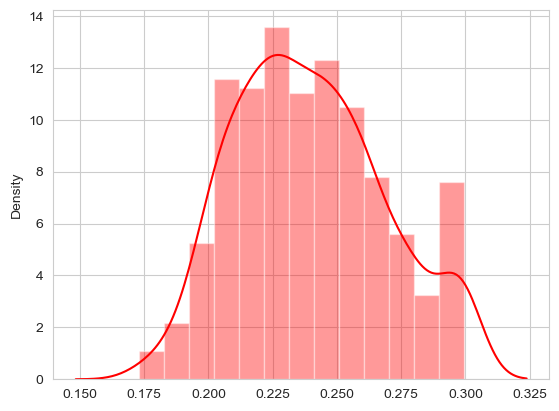

With Skewness radius_worst
0.6108959156195983


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


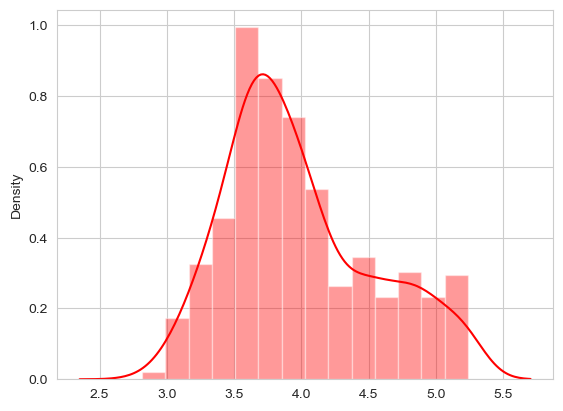

Without Skewness radius_worst
0.48573199210560175


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


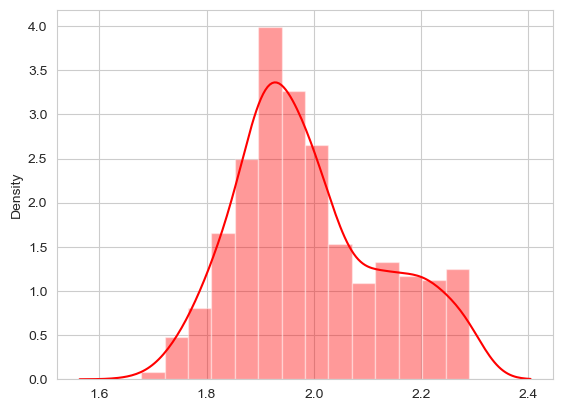

With Skewness texture_worst
0.10964888569002976


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


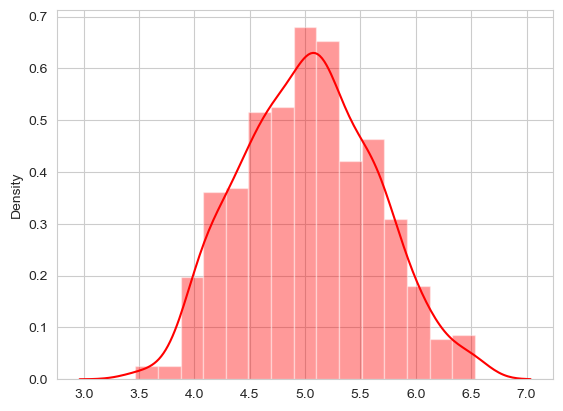

Without Skewness texture_worst
-0.028809792378632498


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


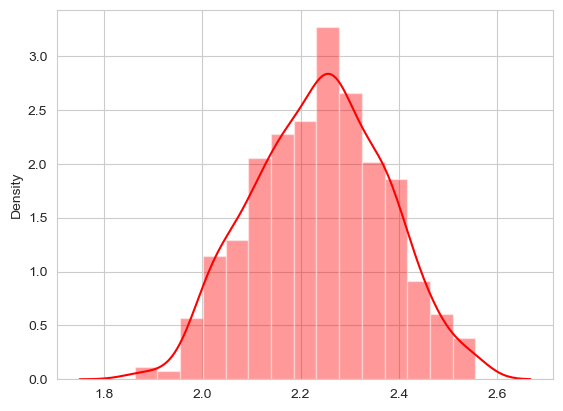

With Skewness perimeter_worst
0.6193005823066018


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


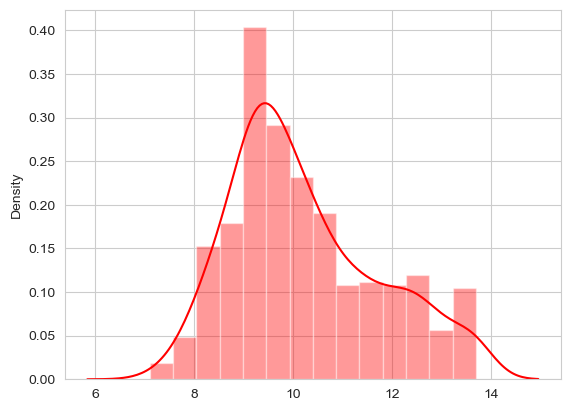

Without Skewness perimeter_worst
0.4866529876313884


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


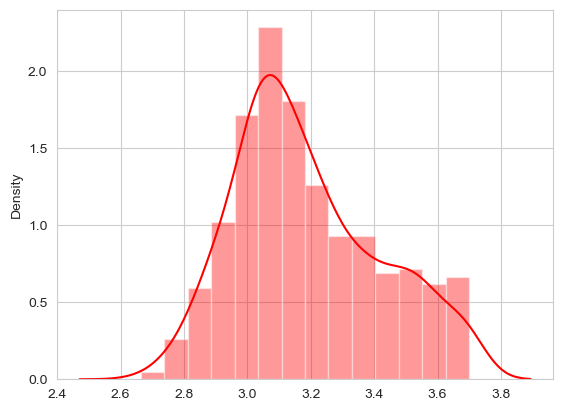

With Skewness area_worst
0.6918418734001373


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


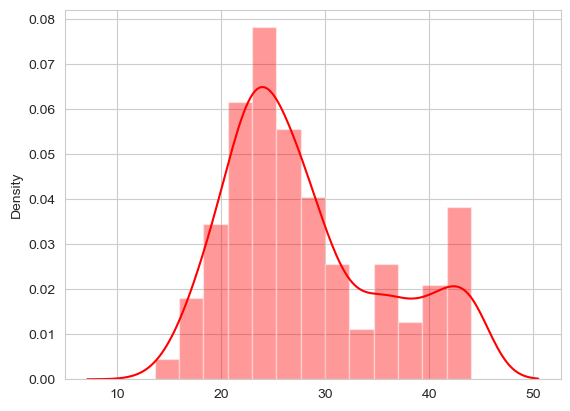

Without Skewness area_worst
0.4827436403738045


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


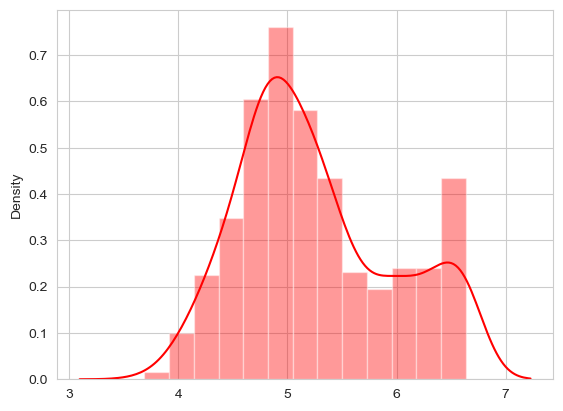

With Skewness smoothness_worst
0.01838412198414551


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


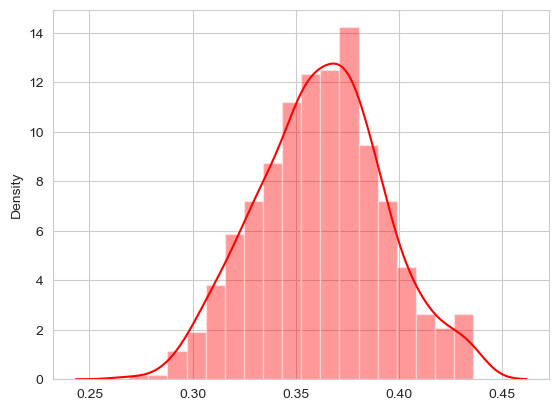

Without Skewness smoothness_worst
-0.09684199828582685


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


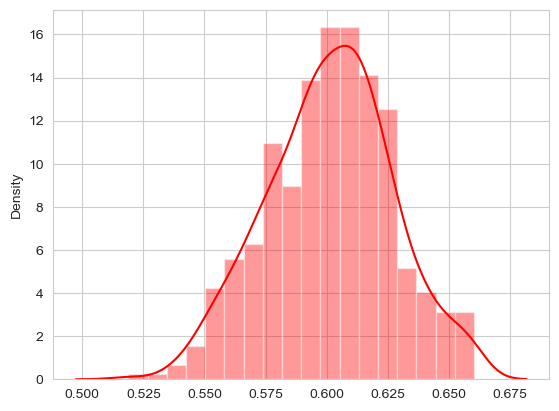

With Skewness compactness_worst
0.34331615425917783


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


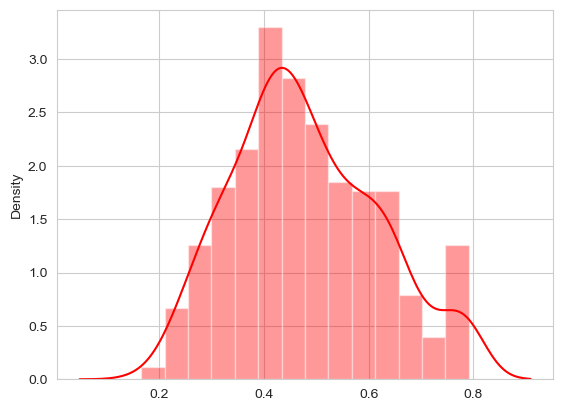

Without Skewness compactness_worst
0.02276526167867096


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


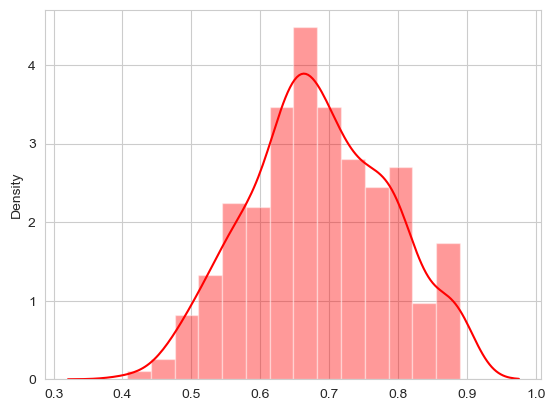

With Skewness concavity_worst
-0.09273042863560392


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


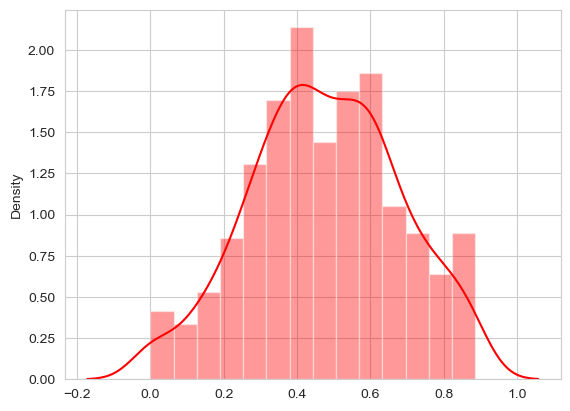

Without Skewness concavity_worst
-1.2987141999058265


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


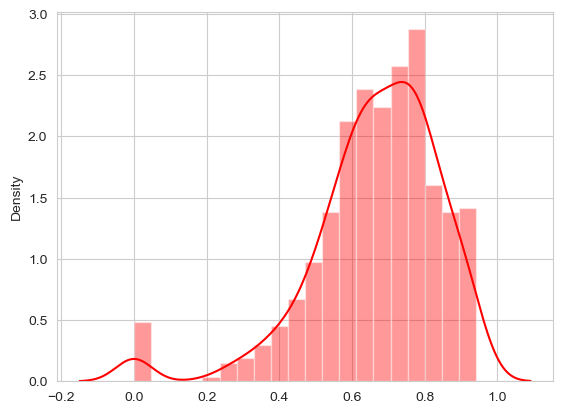

With Skewness concave points_worst
-0.44224375032977575


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


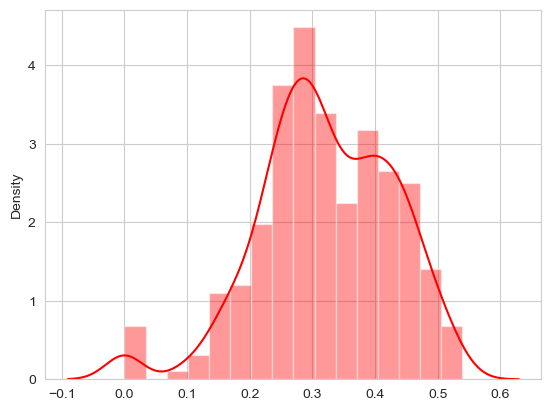

Without Skewness concave points_worst
-2.1934249356377644


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


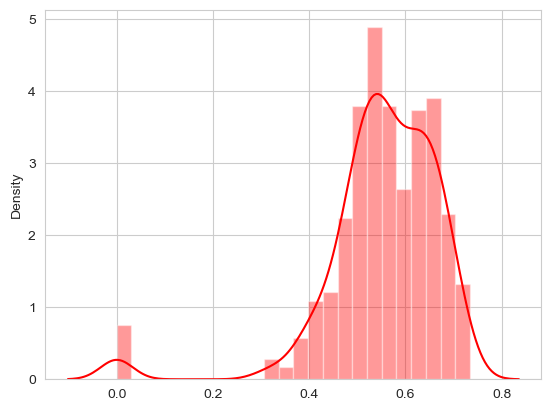

With Skewness symmetry_worst
0.2433456345353303


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


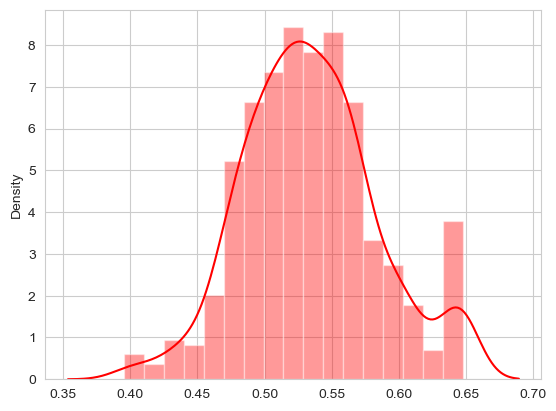

Without Skewness symmetry_worst
0.09759560648137887


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


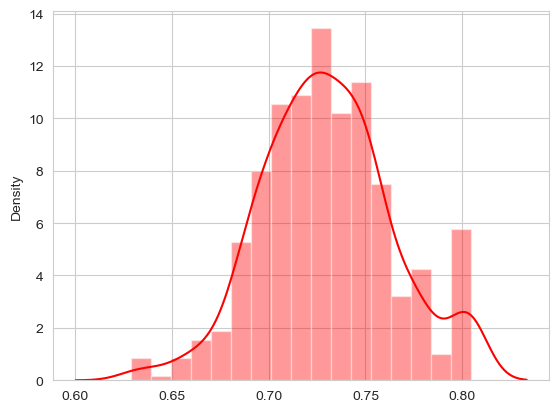

With Skewness fractal_dimension_worst
0.6340895700351585


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


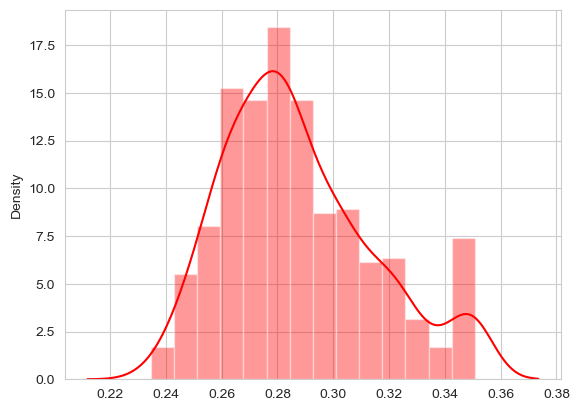

Without Skewness fractal_dimension_worst
0.5355196984736257


C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\4092182873.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[col],color='red')


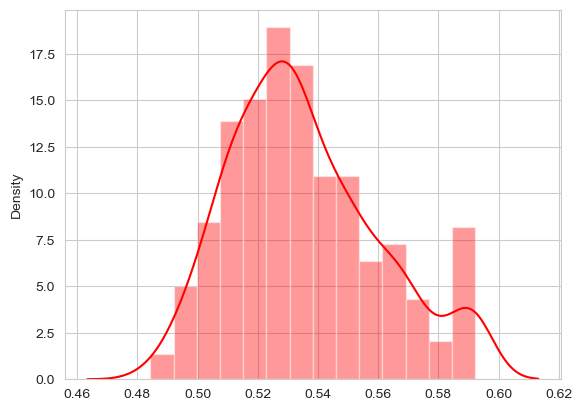

In [48]:
for col in df.columns:
    print("With Skewness "+col)
    print(skew(df[col]))
    
    plt.figure()
    sns.distplot(x=df[col],color='red')
    plt.show()
    
    df[col]=np.sqrt(df[col])
    
    print("Without Skewness "+col)
    print(skew(df[col]))

    plt.figure()
    sns.distplot(x=df[col],color='red')
    plt.show()

## Model Implementation

In [49]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

## Importing Machine Learning Models

In [51]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

## Importing to Check the Model Accuracy, Errors and it's Validations


In [52]:
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score
from sklearn.metrics import classification_report
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_validate, cross_val_score
from sklearn import metrics

In [53]:
df.head(10)

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1.0,2.059481,1.794938,3.328891,5.624819,0.586594,0.691478,0.728987,0.619303,0.701308,...,2.244517,2.040326,3.686022,6.634149,0.634618,0.889832,0.918554,0.717753,0.804623,0.587213
1,1.0,2.129652,2.053156,3.395324,6.034425,0.539538,0.529555,0.542944,0.514681,0.652438,...,2.235844,2.199634,3.549871,6.634149,0.593171,0.657246,0.701091,0.656717,0.724158,0.546225
2,1.0,2.106500,2.147038,3.376648,5.889337,0.575377,0.632357,0.666556,0.598023,0.674435,...,2.203382,2.247826,3.514127,6.429623,0.616441,0.807178,0.819218,0.702104,0.775295,0.544003
3,1.0,1.838301,2.124717,2.967819,4.432767,0.604684,0.691478,0.700946,0.569513,0.704547,...,1.965031,2.268880,3.153306,4.881235,0.660306,0.889832,0.910381,0.712351,0.804623,0.592223
4,1.0,2.122367,1.945975,3.409289,6.001157,0.562763,0.603670,0.667062,0.568291,0.652168,...,2.178906,2.020617,3.512398,6.299704,0.608831,0.672881,0.795271,0.634912,0.697287,0.526395
5,1.0,1.878418,1.990558,3.014433,4.673609,0.597906,0.642114,0.630270,0.533303,0.675897,...,1.983228,2.207577,3.188821,5.218461,0.650540,0.851176,0.855441,0.645951,0.794524,0.592223
6,1.0,2.066882,2.114214,3.306989,5.678823,0.554635,0.574588,0.579403,0.521564,0.650812,...,2.187077,2.293311,3.518153,6.330476,0.616228,0.712421,0.784310,0.662982,0.743938,0.537843
7,1.0,1.924241,2.136350,3.081780,4.903014,0.587213,0.636856,0.553208,0.494614,0.684555,...,2.032332,2.303197,3.242939,5.472656,0.637726,0.778970,0.719371,0.628062,0.751885,0.582464
8,1.0,1.898829,2.161293,3.058454,4.774843,0.597320,0.662982,0.656629,0.553016,0.696253,...,1.983868,2.354456,3.210193,5.214410,0.642397,0.857272,0.856835,0.673700,0.804623,0.572201
9,1.0,1.878795,2.214285,3.027130,4.670667,0.586842,0.691478,0.690478,0.540633,0.671234,...,1.970935,2.525488,3.143533,5.164502,0.656098,0.889832,0.941427,0.685643,0.804623,0.592223


## Train Test Splitting

In [54]:
X = df.drop(['diagnosis'],axis=1)
y = df[['diagnosis']]

In [55]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=15)

### we will use the same data set as it is and observe the resuls of models

# Defining the function for Training the model

In [56]:
def model_building(model, X_train, X_test, y_train, y_test):
    
    """ Model Fitting, Prediction And Other stuff
        return ('score', 'accuracy_score', 'predictions' )
    """
    
    model.fit(X_train, y_train)
    score = model.score(X_train, y_train)
    predictions = model.predict(X_test)
    accuracy = accuracy_score(predictions, y_test)
     
    return (score, accuracy, predictions)

## model selection list

In [57]:
models_list = {
    "Logistic Regression" :  LogisticRegression(),
    "Random Forest Classifier" :  RandomForestClassifier(n_estimators=10, criterion='entropy', random_state=5),
    "Decision Tree Classifier" :  DecisionTreeClassifier(criterion='entropy', random_state=0),
    "Naive Bayes Classifier":GaussianNB(),
    "K Neighbors Classifier":KNeighborsClassifier(),
    "SVC" :  SVC(),
}

In [58]:
print(list(models_list.keys()))
print(list(models_list.values()))

['Logistic Regression', 'Random Forest Classifier', 'Decision Tree Classifier', 'Naive Bayes Classifier', 'K Neighbors Classifier', 'SVC']
[LogisticRegression(), RandomForestClassifier(criterion='entropy', n_estimators=10, random_state=5), DecisionTreeClassifier(criterion='entropy', random_state=0), GaussianNB(), KNeighborsClassifier(), SVC()]


In [59]:
# The function for confision metric Graphs

def cm_metrix_graph(cm):
    
    sns.heatmap(cm,annot=True,fmt="d")
    plt.show()
        

## Calling the function "model_building" to Train the models and Checking the Model Accuracy, Errors, it's Validations and Confusion Metrix

C:\Users\jangr\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)




Classification Report of 'Logistic Regression '

              precision    recall  f1-score   support

         0.0       0.92      0.94      0.93        90
         1.0       0.90      0.87      0.88        53

    accuracy                           0.92       143
   macro avg       0.91      0.91      0.91       143
weighted avg       0.92      0.92      0.92       143



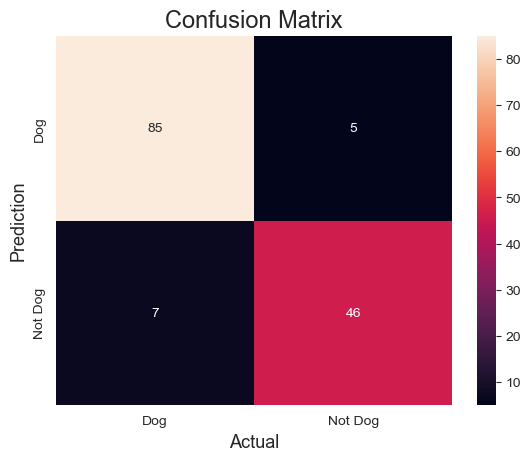

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\3840425258.py:7: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X_train, y_train)




Classification Report of 'Random Forest Classifier '

              precision    recall  f1-score   support

         0.0       0.94      0.98      0.96        90
         1.0       0.96      0.89      0.92        53

    accuracy                           0.94       143
   macro avg       0.95      0.93      0.94       143
weighted avg       0.94      0.94      0.94       143



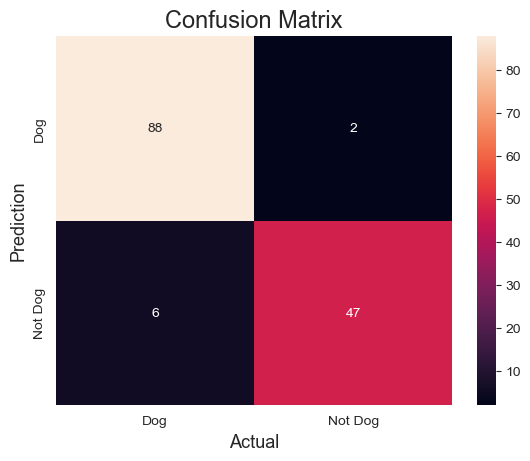



Classification Report of 'Decision Tree Classifier '

              precision    recall  f1-score   support

         0.0       0.90      0.93      0.92        90
         1.0       0.88      0.83      0.85        53

    accuracy                           0.90       143
   macro avg       0.89      0.88      0.89       143
weighted avg       0.89      0.90      0.89       143



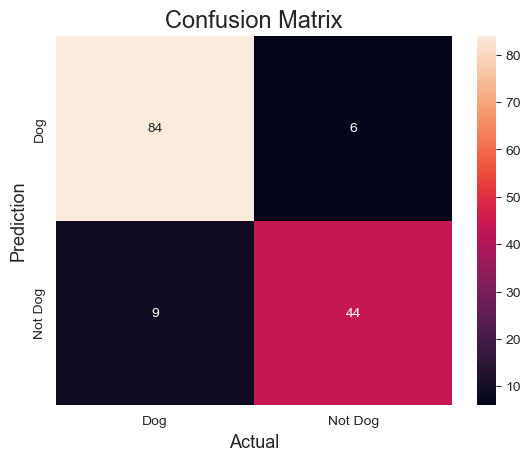

C:\Users\jangr\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)




Classification Report of 'Naive Bayes Classifier '

              precision    recall  f1-score   support

         0.0       0.92      0.93      0.93        90
         1.0       0.88      0.87      0.88        53

    accuracy                           0.91       143
   macro avg       0.90      0.90      0.90       143
weighted avg       0.91      0.91      0.91       143



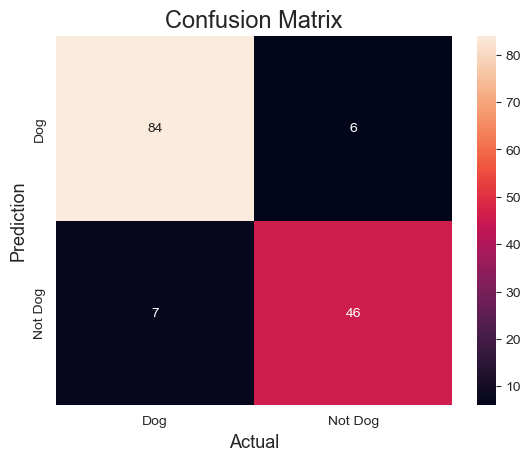

C:\Users\jangr\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)




Classification Report of 'K Neighbors Classifier '

              precision    recall  f1-score   support

         0.0       0.93      0.96      0.95        90
         1.0       0.92      0.89      0.90        53

    accuracy                           0.93       143
   macro avg       0.93      0.92      0.92       143
weighted avg       0.93      0.93      0.93       143



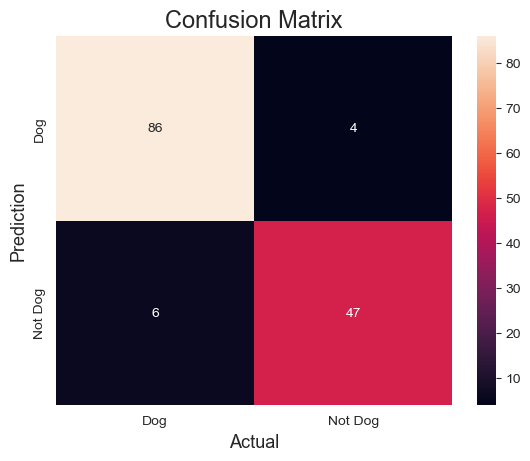

C:\Users\jangr\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)




Classification Report of 'SVC '

              precision    recall  f1-score   support

         0.0       0.86      0.99      0.92        90
         1.0       0.97      0.74      0.84        53

    accuracy                           0.90       143
   macro avg       0.92      0.86      0.88       143
weighted avg       0.91      0.90      0.89       143



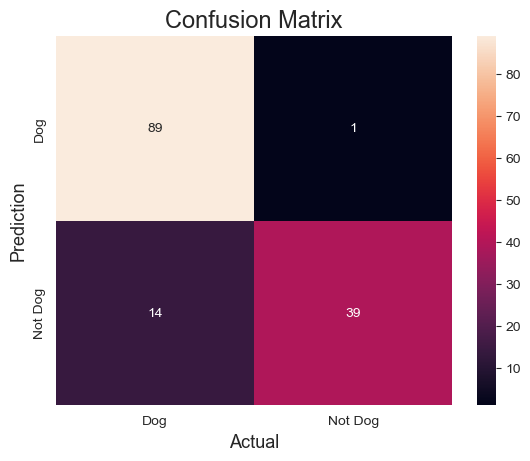

In [60]:
df_prediction = []
confusion_matrixs = []
df_prediction_cols = [ 'model_name', 'score', 'accuracy_score' , "accuracy_percentage"]

for name, model in zip(list(models_list.keys()), list(models_list.values())):
    
    (score, accuracy, predictions) = model_building(model, X_train, X_test, y_train, y_test )
    
    print(( "\n\nClassification Report of '") + str(name), "'\n")
    
    print(classification_report(y_test, predictions))

    df_prediction.append([name, score, accuracy, "{0:.2%}".format(accuracy)])
    
    # For Showing Metrics
    confusion_matrixs.append(confusion_matrix(y_test, predictions))
    

    # For confusion Metrics heatmap
    cm = confusion_matrix(y_test,predictions)
 
     #Plot the confusion matrix.
    sns.heatmap(cm, annot=True,
            fmt='g', 
            xticklabels=['Dog','Not Dog'],
            yticklabels=['Dog','Not Dog'])
    plt.ylabel('Prediction',fontsize=13)
    plt.xlabel('Actual',fontsize=13)
    plt.title('Confusion Matrix',fontsize=17)
    plt.show()
    
  
    
    
    

In [61]:
print(len(confusion_matrixs))

6


## Normalization Using sklearn

In [63]:
# data normalization with sklearn
from sklearn.preprocessing import MinMaxScaler

# fit scaler on training data
norm = MinMaxScaler().fit(X_train)

# transform training data
X_train_norm = norm.transform(X_train)

# transform testing dataabs
X_test_norm = norm.transform(X_test)

In [64]:
print(X_train_norm)

[[0.60224488 0.35977751 0.59293931 ... 0.86097168 0.51962094 0.39049708]
 [0.56009755 0.39347093 0.5409283  ... 0.58083039 0.15747151 0.24550722]
 [0.5574949  0.50346628 0.53854938 ... 0.6743849  0.38305109 0.28058422]
 ...
 [0.79040426 0.63599778 0.78821225 ... 0.84943453 0.42986462 0.39920925]
 [0.52714808 0.27479951 0.51613077 ... 0.74929805 0.53665632 0.33179202]
 [0.41134687 0.9676903  0.40451883 ... 0.69616371 0.59124189 0.31523706]]


In [65]:
print(X_test_norm)

[[0.41355913 0.46111627 0.39185041 ... 0.61862877 0.53477392 0.24811305]
 [0.29891517 0.48449667 0.29401618 ... 0.66158854 0.651754   0.55855118]
 [0.70278378 0.510379   0.68977094 ... 0.80400759 0.55756488 0.46425167]
 ...
 [0.91955775 0.88066133 0.90738657 ... 0.92733643 0.72466116 0.38237663]
 [0.6981504  0.37812859 0.69559895 ... 0.90833881 0.63922974 0.60483238]
 [0.65744978 0.3069863  0.66786576 ... 0.9522751  1.         0.71591148]]


C:\Users\jangr\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)




Classification Report of 'Logistic Regression '

              precision    recall  f1-score   support

         0.0       0.95      0.97      0.96        90
         1.0       0.94      0.91      0.92        53

    accuracy                           0.94       143
   macro avg       0.94      0.94      0.94       143
weighted avg       0.94      0.94      0.94       143



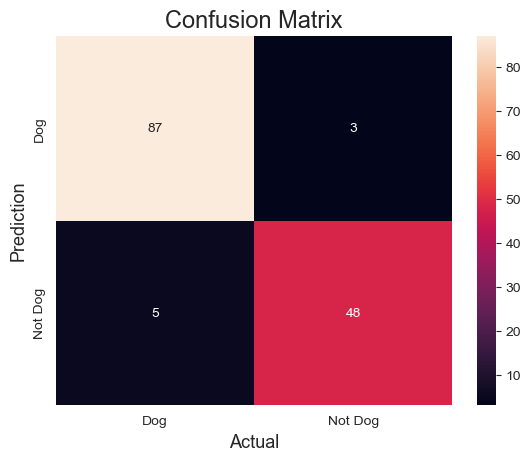

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\3840425258.py:7: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X_train, y_train)




Classification Report of 'Random Forest Classifier '

              precision    recall  f1-score   support

         0.0       0.94      0.98      0.96        90
         1.0       0.96      0.89      0.92        53

    accuracy                           0.94       143
   macro avg       0.95      0.93      0.94       143
weighted avg       0.94      0.94      0.94       143



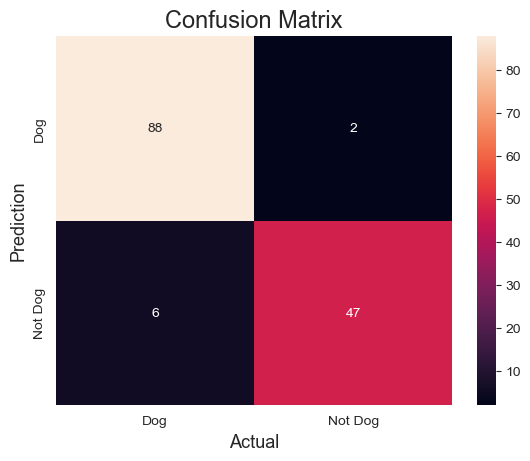



Classification Report of 'Decision Tree Classifier '

              precision    recall  f1-score   support

         0.0       0.90      0.93      0.92        90
         1.0       0.88      0.83      0.85        53

    accuracy                           0.90       143
   macro avg       0.89      0.88      0.89       143
weighted avg       0.89      0.90      0.89       143



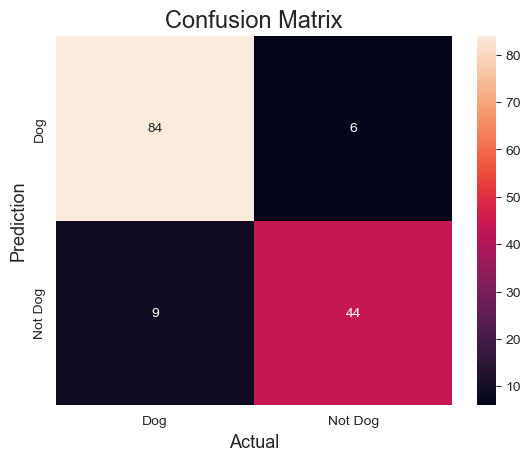

C:\Users\jangr\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)




Classification Report of 'Naive Bayes Classifier '

              precision    recall  f1-score   support

         0.0       0.92      0.93      0.93        90
         1.0       0.88      0.87      0.88        53

    accuracy                           0.91       143
   macro avg       0.90      0.90      0.90       143
weighted avg       0.91      0.91      0.91       143



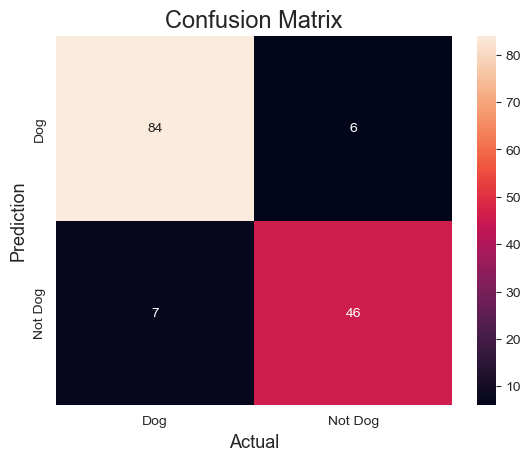

C:\Users\jangr\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)




Classification Report of 'K Neighbors Classifier '

              precision    recall  f1-score   support

         0.0       0.94      0.97      0.95        90
         1.0       0.94      0.89      0.91        53

    accuracy                           0.94       143
   macro avg       0.94      0.93      0.93       143
weighted avg       0.94      0.94      0.94       143



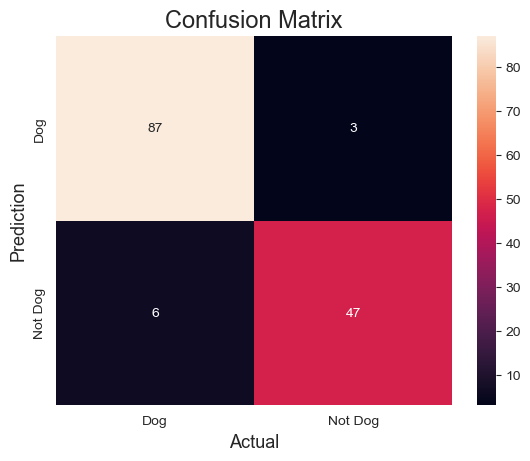

C:\Users\jangr\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)




Classification Report of 'SVC '

              precision    recall  f1-score   support

         0.0       0.95      0.98      0.96        90
         1.0       0.96      0.91      0.93        53

    accuracy                           0.95       143
   macro avg       0.95      0.94      0.95       143
weighted avg       0.95      0.95      0.95       143



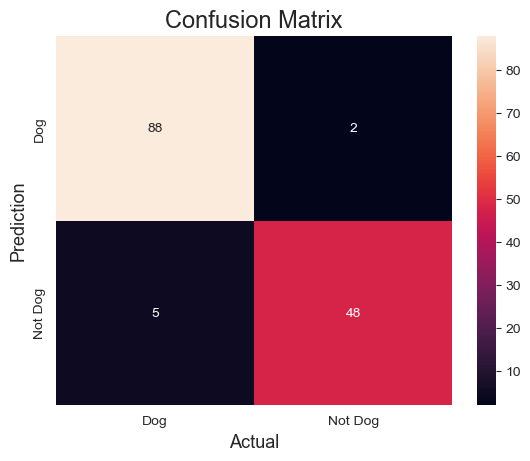

In [66]:
df_prediction = []
confusion_matrixs = []
df_prediction_cols = [ 'model_name', 'score', 'accuracy_score' , "accuracy_percentage"]

for name, model in zip(list(models_list.keys()), list(models_list.values())):
    
    (score, accuracy, predictions) = model_building(model, X_train_norm, X_test_norm, y_train, y_test )
    
    print(( "\n\nClassification Report of '") + str(name), "'\n")
    
    print(classification_report(y_test, predictions))

    df_prediction.append([name, score, accuracy, "{0:.2%}".format(accuracy)])
    
    # For Showing Metrics
    confusion_matrixs.append(confusion_matrix(y_test, predictions))
    

    # For confusion Metrics heatmap
    cm = confusion_matrix(y_test,predictions)
 
     #Plot the confusion matrix.
    sns.heatmap(cm, annot=True,
            fmt='g', 
            xticklabels=['Dog','Not Dog'],
            yticklabels=['Dog','Not Dog'])
    plt.ylabel('Prediction',fontsize=13)
    plt.xlabel('Actual',fontsize=13)
    plt.title('Confusion Matrix',fontsize=17)
    plt.show()
    
 

## After the Normalization score

In [81]:
df_prediction = []
print(len(confusion_matrixs))
df_pred

6


NameError: name 'df_pred' is not defined

## Standardization Using sklearn

In [69]:
# data standardization with  sklearn
from sklearn.preprocessing import StandardScaler

# copy of datasets
X_train_stand = X_train.copy()
X_test_stand = X_test.copy()

# numerical features
num_cols = list(X_train)


In [70]:
print(num_cols)

['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']


In [71]:
# apply standardization on numerical features
for i in num_cols:
    
    # fit on training data column
    scale = StandardScaler().fit(X_train_stand[[i]])
    
    # transform the training data column
    X_train_stand[i] = scale.transform(X_train_stand[[i]])
    
    # transform the testing data column
    X_test_stand[i] = scale.transform(X_test_stand[[i]])

In [72]:
print(X_test_stand.head())

     radius_mean  texture_mean  perimeter_mean  area_mean  smoothness_mean  \
350    -0.681641     -0.476220       -0.748646  -0.677203        -1.660884   
222    -1.219489     -0.354106       -1.210548  -1.229391         0.743216   
141     0.675248     -0.218924        0.657918   0.706733         0.102615   
447     0.308584     -0.320031        0.281990   0.291556        -0.309819   
103    -1.337145      0.118881       -1.277016  -1.315865         0.344619   

     compactness_mean  concavity_mean  concave points_mean  symmetry_mean  \
350         -1.841431       -1.390099            -0.984042      -0.511620   
222         -0.245846       -0.943438            -0.587756       0.403153   
141          0.381669        0.407134             0.516863       0.222907   
447         -0.152446       -0.342123            -0.445046       0.341016   
103          0.032428        0.006197            -0.177808       0.529787   

     fractal_dimension_mean  ...  radius_worst  texture_worst  \
350

C:\Users\jangr\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)




Classification Report of 'Logistic Regression '

              precision    recall  f1-score   support

         0.0       0.97      0.97      0.97        90
         1.0       0.94      0.94      0.94        53

    accuracy                           0.96       143
   macro avg       0.96      0.96      0.96       143
weighted avg       0.96      0.96      0.96       143



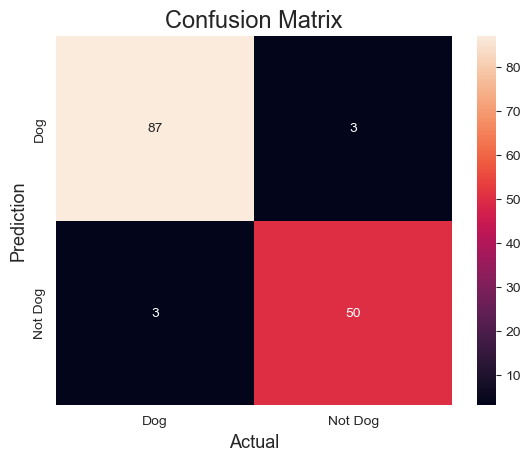

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\3840425258.py:7: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X_train, y_train)




Classification Report of 'Random Forest Classifier '

              precision    recall  f1-score   support

         0.0       0.94      0.98      0.96        90
         1.0       0.96      0.89      0.92        53

    accuracy                           0.94       143
   macro avg       0.95      0.93      0.94       143
weighted avg       0.94      0.94      0.94       143



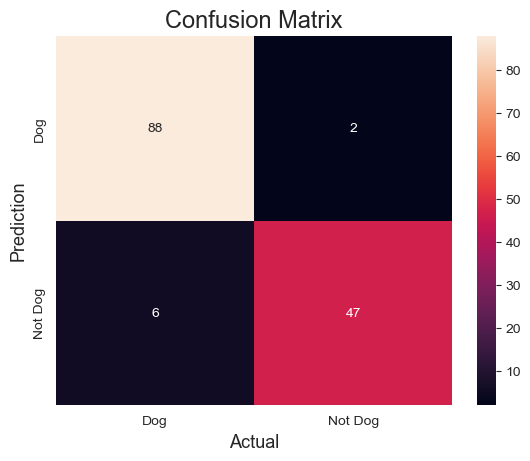



Classification Report of 'Decision Tree Classifier '

              precision    recall  f1-score   support

         0.0       0.90      0.93      0.92        90
         1.0       0.88      0.83      0.85        53

    accuracy                           0.90       143
   macro avg       0.89      0.88      0.89       143
weighted avg       0.89      0.90      0.89       143



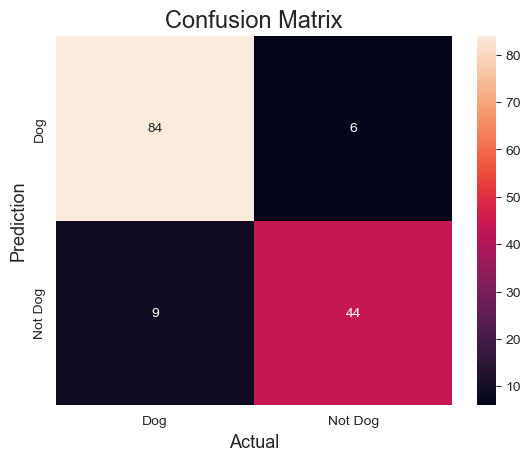

C:\Users\jangr\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)




Classification Report of 'Naive Bayes Classifier '

              precision    recall  f1-score   support

         0.0       0.92      0.93      0.93        90
         1.0       0.88      0.87      0.88        53

    accuracy                           0.91       143
   macro avg       0.90      0.90      0.90       143
weighted avg       0.91      0.91      0.91       143



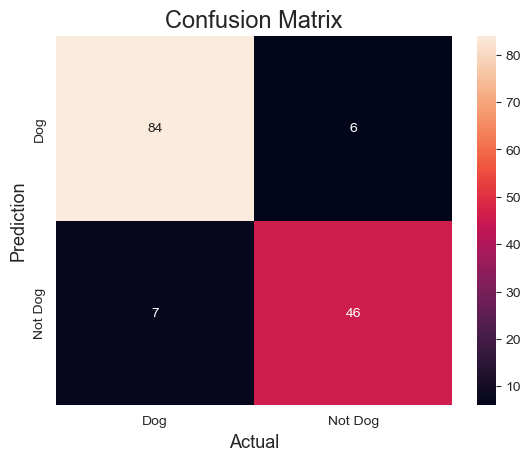

C:\Users\jangr\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)




Classification Report of 'K Neighbors Classifier '

              precision    recall  f1-score   support

         0.0       0.96      0.98      0.97        90
         1.0       0.96      0.92      0.94        53

    accuracy                           0.96       143
   macro avg       0.96      0.95      0.95       143
weighted avg       0.96      0.96      0.96       143



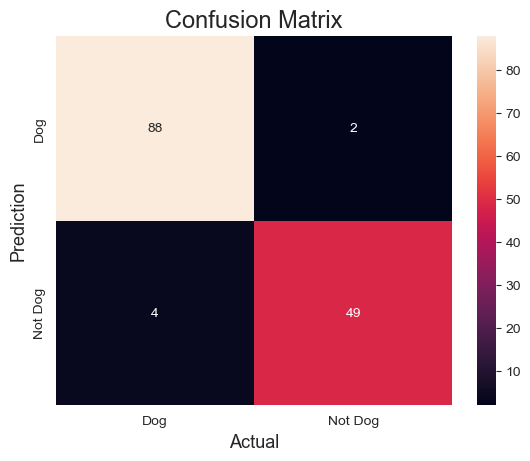

C:\Users\jangr\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)




Classification Report of 'SVC '

              precision    recall  f1-score   support

         0.0       0.95      0.98      0.96        90
         1.0       0.96      0.91      0.93        53

    accuracy                           0.95       143
   macro avg       0.95      0.94      0.95       143
weighted avg       0.95      0.95      0.95       143



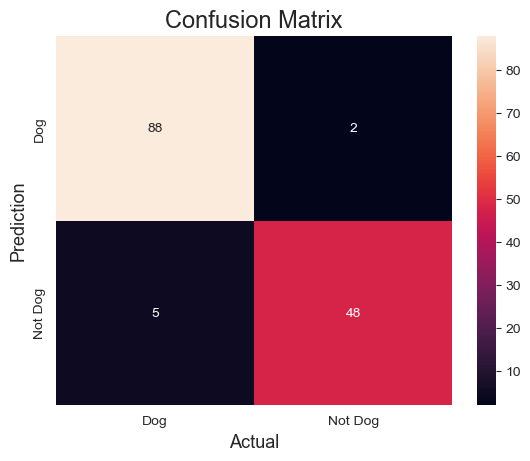

In [73]:
df_prediction = []
confusion_matrixs = []
df_prediction_cols = [ 'model_name', 'score', 'accuracy_score' , "accuracy_percentage"]

for name, model in zip(list(models_list.keys()), list(models_list.values())):
    
    (score, accuracy, predictions) = model_building(model, X_train_stand, X_test_stand, y_train, y_test )
    
    print(( "\n\nClassification Report of '") + str(name), "'\n")
    
    print(classification_report(y_test, predictions))

    df_prediction.append([name, score, accuracy, "{0:.2%}".format(accuracy)])
    
    # For Showing Metrics
    confusion_matrixs.append(confusion_matrix(y_test, predictions))
    

    # For confusion Metrics heatmap
    cm = confusion_matrix(y_test,predictions)
 
     #Plot the confusion matrix.
    sns.heatmap(cm, annot=True,
            fmt='g', 
            xticklabels=['Dog','Not Dog'],
            yticklabels=['Dog','Not Dog'])
    plt.ylabel('Prediction',fontsize=13)
    plt.xlabel('Actual',fontsize=13)
    plt.title('Confusion Matrix',fontsize=17)
    plt.show()
    

## We have Litilbit imbalanced data,
so we will use Resampling Techniques to Solve Class Imbalance

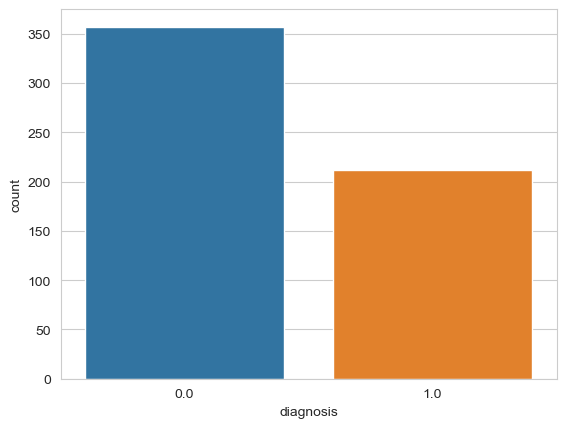

0.0    357
1.0    212
Name: diagnosis, dtype: int64

In [74]:
sns.countplot(x='diagnosis',data=df)
plt.show()
df.diagnosis.value_counts()

### We will start by separating the class that will be 0 and class 1.

In [75]:
# class count
class_count_0, class_count_1 = df['diagnosis'].value_counts()

# Separate class
class_0 = df[df['diagnosis'] == 0]
class_1 = df[df['diagnosis'] == 1]

# print the shape of the class
print('class 0:', class_0.shape)
print('class 1:', class_1.shape)

class 0: (357, 31)
class 1: (212, 31)


#  Random Under-Sampling

total diagnosis of 1 and 0:
 0.0    212
1.0    212
Name: diagnosis, dtype: int64


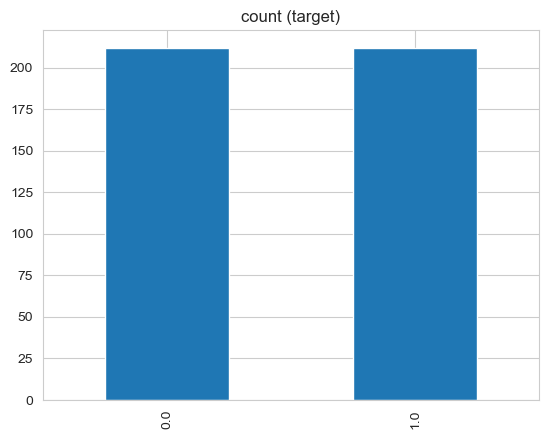

In [76]:
class_0_under = class_0.sample(class_count_1)

test_under = pd.concat([class_0_under, class_1], axis=0)

print("total diagnosis of 1 and 0:\n",test_under['diagnosis'].value_counts())# plot the count after under-sampeling
test_under['diagnosis'].value_counts().plot(kind='bar', title='count (target)')
plt.show()

In [77]:
import imblearn

In [78]:
from imblearn.under_sampling import RandomUnderSampler

rus = RandomUnderSampler(random_state=42, replacement=True)
# fit predictor and target variable
x_rus, y_rus = rus.fit_resample(X, y)

print('original dataset shape:', y.value_counts())
print('Resample dataset shape', y_rus.value_counts())

original dataset shape: diagnosis
0.0          357
1.0          212
dtype: int64
Resample dataset shape diagnosis
0.0          212
1.0          212
dtype: int64


In [79]:
X_train, X_test, y_train, y_test = train_test_split(x_rus, y_rus, test_size=0.25, random_state=15)

C:\Users\jangr\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\jangr\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(




Classification Report of 'Logistic Regression '

              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98        55
         1.0       1.00      0.96      0.98        51

    accuracy                           0.98       106
   macro avg       0.98      0.98      0.98       106
weighted avg       0.98      0.98      0.98       106



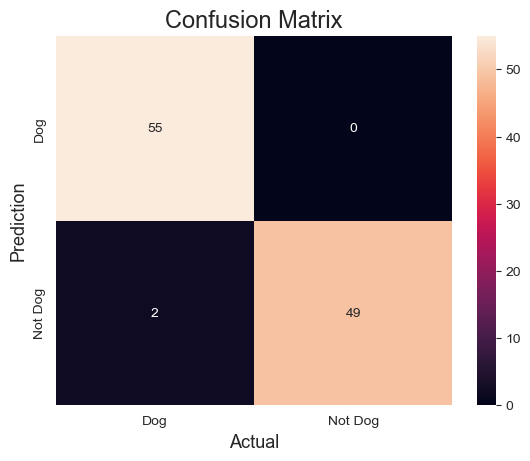

C:\Users\jangr\AppData\Local\Temp\ipykernel_12972\3840425258.py:7: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X_train, y_train)




Classification Report of 'Random Forest Classifier '

              precision    recall  f1-score   support

         0.0       0.95      1.00      0.97        55
         1.0       1.00      0.94      0.97        51

    accuracy                           0.97       106
   macro avg       0.97      0.97      0.97       106
weighted avg       0.97      0.97      0.97       106



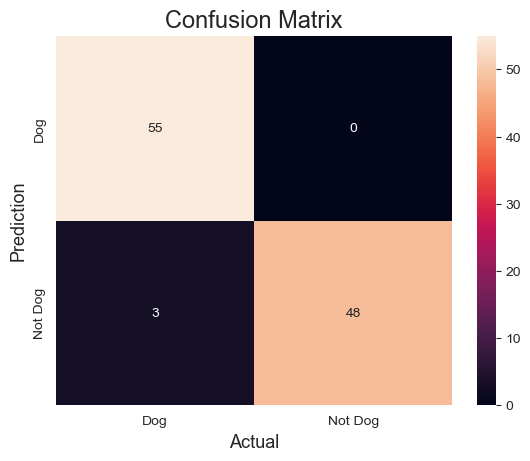



Classification Report of 'Decision Tree Classifier '

              precision    recall  f1-score   support

         0.0       0.89      1.00      0.94        55
         1.0       1.00      0.86      0.93        51

    accuracy                           0.93       106
   macro avg       0.94      0.93      0.93       106
weighted avg       0.94      0.93      0.93       106



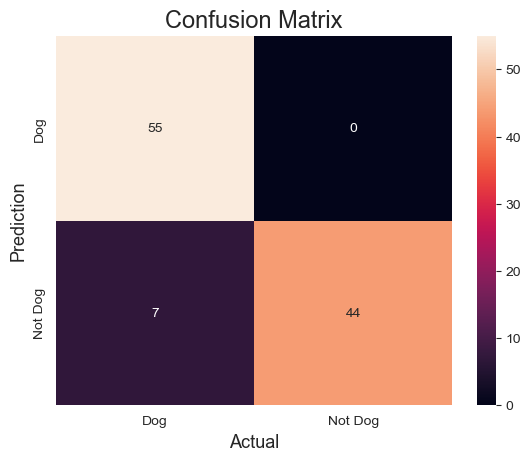

C:\Users\jangr\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)




Classification Report of 'Naive Bayes Classifier '

              precision    recall  f1-score   support

         0.0       0.90      1.00      0.95        55
         1.0       1.00      0.88      0.94        51

    accuracy                           0.94       106
   macro avg       0.95      0.94      0.94       106
weighted avg       0.95      0.94      0.94       106



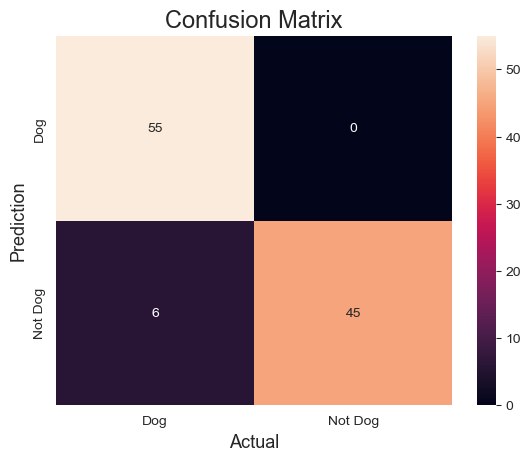

C:\Users\jangr\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)




Classification Report of 'K Neighbors Classifier '

              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98        55
         1.0       1.00      0.96      0.98        51

    accuracy                           0.98       106
   macro avg       0.98      0.98      0.98       106
weighted avg       0.98      0.98      0.98       106



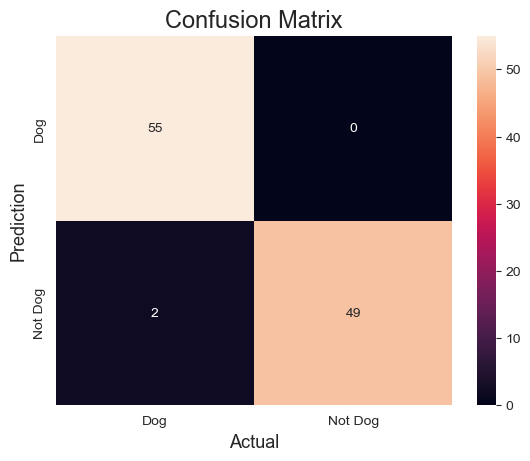

C:\Users\jangr\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)




Classification Report of 'SVC '

              precision    recall  f1-score   support

         0.0       0.90      1.00      0.95        55
         1.0       1.00      0.88      0.94        51

    accuracy                           0.94       106
   macro avg       0.95      0.94      0.94       106
weighted avg       0.95      0.94      0.94       106



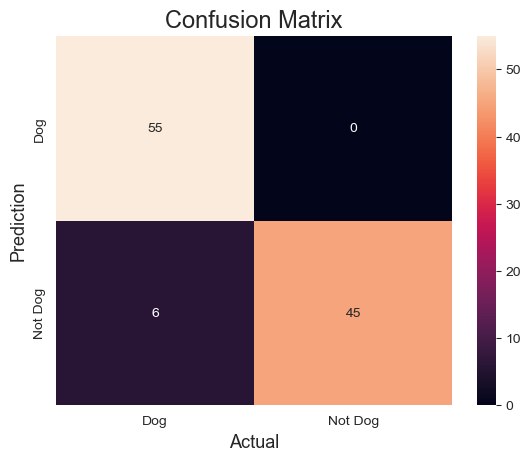

In [80]:
df_prediction = []
confusion_matrixs = []
df_prediction_cols = [ 'model_name', 'score', 'accuracy_score' , "accuracy_percentage"]

for name, model in zip(list(models_list.keys()), list(models_list.values())):
    
    (score, accuracy, predictions) = model_building(model, X_train, X_test, y_train, y_test )
    
    print(( "\n\nClassification Report of '") + str(name), "'\n")
    
    print(classification_report(y_test, predictions))

    df_prediction.append([name, score, accuracy, "{0:.2%}".format(accuracy)])
    
    # For Showing Metrics
    confusion_matrixs.append(confusion_matrix(y_test, predictions))
    

    # For confusion Metrics heatmap
    cm = confusion_matrix(y_test,predictions)
 
     #Plot the confusion matrix.
    sns.heatmap(cm, annot=True,
            fmt='g', 
            xticklabels=['Dog','Not Dog'],
            yticklabels=['Dog','Not Dog'])
    plt.ylabel('Prediction',fontsize=13)
    plt.xlabel('Actual',fontsize=13)
    plt.title('Confusion Matrix',fontsize=17)
    plt.show()
    